# <font color="#114b98">Développez une preuve de concept</font>

Ce projet vise à explorer et implémenter une nouvelle méthode pour améliorer un algorithme de machine learning actuellement en production. 

Le jeu de données étudié dans ce projet se nomme **UTKFace**, un ensemble de données de visages à grande échelle contenant des images avec des informations d'âge, de genre et d'origine ethnique. Il est disponible au lien suivant : https://susanqq.github.io/UTKFace/.

Ces images offrent une grande variété de caractéristiques faciales, permettant ainsi une meilleure généralisation pour les applications de reconnaissance des émotions et d'autres attributs faciaux dans des situations réelles.

Tout d'abord, nous utiliserons le modèle **InceptionV3**, qui a été entraîné sur l'ensemble de données **ImageNet**, pour extraire les caractéristiques des images, et avoir référence (ou "baseline") pour évaluer les performances de nos modèles ultérieurs.

Nous rencontrons un problème du déséquilibre des classes pour l'âge et l'origine ethnique, que nous allons résoudre de deux manières différentes. 

Pour l'âge, nous utiliserons la méthode **DenseWeight** (Steininger, M., Kobs, K., Davidson, P. et al. Density-based weighting for imbalanced regression. Mach Learn 110, 2187–2211 (2021). https://doi.org/10.1007/s10994-021-06023-5), qui pondère les erreurs de manière à accorder plus d'importance aux classes sous-représentées. 

Pour l'origine ethnique, nous utiliserons la fonction de perte **VSLoss** (Ganesh Ramachandra Kini, Orestis Paraskevas, Samet Oymak, Christos Thrampoulidis Label-Imbalanced and Group-Sensitive Classification under Overparameterization. arXiv preprint arXiv:2103.01550 (2021). https://arxiv.org/abs/1906.07413), qui vise à réduire le déséquilibre de la distribution de la classe majoritaire en augmentant la marge entre les scores de cette classe et les scores des autres classes.

Nous allons ensuite construire notre propre modèle pour prédire **l'âge, le genre et l'origine ethnique simultanément**. Nous allons entraîner et évaluer ce modèle sur l'ensemble de données UTKFace, en utilisant des métriques appropriées pour chaque tâche. Nous comparerons également les performances de notre modèle à celles du modèle InceptionV3, afin de déterminer s'il est capable d'améliorer les performances de la référence.

Enfin, nous effectuerons une analyse approfondie de notre modèle pour comprendre ses forces et ses faiblesses, et pour proposer des pistes d'amélioration pour de futures recherches dans ce domaine.

## <font color="#114b98">Sommaire</font>
[1. Chargement des librairies et du jeu de données](#section_1)

[2. Exploration du jeu de données](#section_2)

[3. Préparation des données](#section_3)

[4. Modèle InceptionV3](#section_4)

[5. Solutions pour le déséquilibre de classes](#section_5)

[6. Comparaison des performances et analyse](#section_6)

## <font color="#114b98" id="section_1">1. Chargement du jeu de données</font>

In [135]:
import os
import re
import sys
import pickle
import sklearn
import warnings
import visualkeras
import numpy as np
import pandas as pd
import seaborn as sns
import multiprocessing
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
from PIL import Image, ImageFont
from keras_tuner import Objective
import plotly.graph_objects as go
import matplotlib.ticker as ticker
from collections import defaultdict
import matplotlib.colors as mcolors
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import confusion_matrix
from tensorflow.keras.models import Sequential
from tensorflow.keras.models import load_model
from keras_tuner.tuners import BayesianOptimization
from tensorflow.keras import Model, mixed_precision
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.callbacks import LambdaCallback
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Input, Dense, Dropout, GlobalAveragePooling2D, Rescaling
from tensorflow.keras.layers import BatchNormalization, MaxPooling2D, Flatten, ZeroPadding2D, Conv2D

In [136]:
print("System Version: ", sys.version)
print("Scikit-learn Version: ", sklearn.__version__)
print("Tensorflow Version: ", tf.__version__)
print("Keras Version: ", tf.keras.__version__)
print("Num CPUs Available: ", multiprocessing.cpu_count())
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
print("Tensorflow build with CUDA:", tf.test.is_built_with_cuda())

# Increase GPU capacity
os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true'
policy = mixed_precision.Policy("mixed_float16")
mixed_precision.set_global_policy(policy)

System Version:  3.9.13 (main, Aug 25 2022, 23:51:50) [MSC v.1916 64 bit (AMD64)]
Scikit-learn Version:  1.2.2
Tensorflow Version:  2.10.1
Keras Version:  2.10.0
Num CPUs Available:  16
Num GPUs Available:  1
Tensorflow build with CUDA: True


In [137]:
warnings.filterwarnings('ignore')
plt.style.use('seaborn')
tf.autograph.set_verbosity(0)
font = ImageFont.truetype("arial.ttf", 20) 
palette = sns.color_palette("Set2", n_colors=10)
colors = [mcolors.to_hex(mcolors.to_rgba(color)) for color in palette]
color_map = defaultdict(dict)
color_map[ZeroPadding2D]['fill'] = colors[0]
color_map[Rescaling]['fill'] = colors[1]
color_map[Dropout]['fill'] = colors[2]
color_map[MaxPooling2D]['fill'] = colors[3]
color_map[Conv2D]['fill'] = colors[4]
color_map[Dense]['fill'] = colors[6]
color_map[Flatten]['fill'] = colors[5]
color_map[BatchNormalization]['fill'] = colors[7]
color_map[GlobalAveragePooling2D]['fill'] = colors[8]
color_map[Sequential]['fill'] = colors[9]
# %load_ext pycodestyle_magic
# %pycodestyle_on

In [138]:
# Répertoire de travail
path = 'N:/5 - WORK/1 - Projets/Projet 7/ressources/UTKFace/'
dataset_dir = path + 'cropped'

# Definition de la taille des batchs et des images
batch_size = 32
image_size = (200, 200)

# Fonction pour le pre-processing des images
def preprocess_image(row):
    image_path = row['image_path']
    image = Image.open(image_path)
    return np.array(image) / 255.0

# Définition de dictionnaires des résultats
dict_age_mae = dict()
dict_gender_accuracy = dict()
dict_ethnicity_accuracy = dict()

ethnicity_mapping = {
    0: 'White',
    1: 'Black',
    2: 'Asian',
    3: 'Indian',
    4: 'Others'
}

# Fonction de chargement du dataset
def load_dataset(dataset_dir):
    file_list = os.listdir(dataset_dir)
    data = [{'age': int(matches[1]),
             'gender': int(matches[2]),
             'ethnicity': int(matches[3]),
             'image_path': os.path.join(dataset_dir, file)} 
            for file in file_list
            if file.endswith('.jpg.chip.jpg') or file.endswith('.jpg')
            if (matches := re.match(r'(\d+)_(\d)_(\d)_', file))]
    df = pd.DataFrame(data)
    return df.rename(columns={'race': 'ethnicity'})

# Chargement du dataset
df = load_dataset(dataset_dir)
df.head()

,age,gender,ethnicity,image_path
0,100,0,0,N:/5 - WORK/1 - Projets/Projet 7/ressources/UT...
1,100,0,0,N:/5 - WORK/1 - Projets/Projet 7/ressources/UT...
2,100,1,0,N:/5 - WORK/1 - Projets/Projet 7/ressources/UT...
3,100,1,0,N:/5 - WORK/1 - Projets/Projet 7/ressources/UT...
4,100,1,0,N:/5 - WORK/1 - Projets/Projet 7/ressources/UT...


Les étiquettes de chaque image de visage sont intégrées dans le nom du fichier, formatées comme [âge][sexe][race]_[date&heure].jpg

 - [âge] est un entier de 0 à 116, indiquant l'âge
 - [sexe] est soit 0 (Male) ou 1 (Female)
 - [race] est un entier de 0 à 4, indiquant White, Black, Asian, Indian et Other (comme Hispanique, Latino, Moyen-Orient).

## <font color="#114b98" id="section_2">2. Exploration du jeu de données</font>

In [139]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23690 entries, 0 to 23689
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   age         23690 non-null  int64 
 1   gender      23690 non-null  int64 
 2   ethnicity   23690 non-null  int64 
 3   image_path  23690 non-null  object
dtypes: int64(3), object(1)
memory usage: 740.4+ KB


In [140]:
# df = df.sample(5000)

In [141]:
classes_age = df['age'].nunique()
classes_genre = df['gender'].nunique()
classes_ethnicite = df['ethnicity'].nunique()

print("Nombre de classes d'âge uniques :", classes_age)
print("Nombre de classes de genre uniques :", classes_genre)
print("Nombre de classes d'ethnicité uniques :", classes_ethnicite)

Nombre de classes d'âge uniques : 104
Nombre de classes de genre uniques : 2
Nombre de classes d'ethnicité uniques : 5


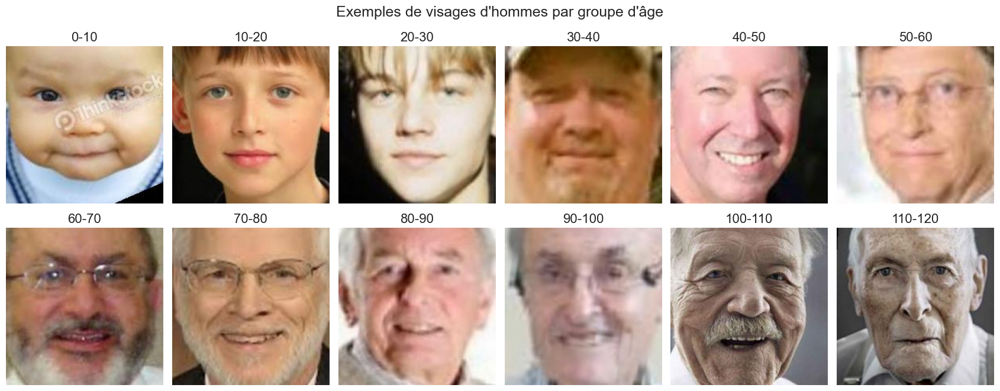

In [142]:
# Définition des groupes d'âge
age_bins = [(0, 10), (10, 20), (20, 30), (30, 40), (40, 50), (50, 60), (60, 70), (70, 80), (80, 90), (90, 100), (100, 110), (110, 120)]

# Create a dictionary to store one example face for each age bin
example_faces = {i: None for i in range(len(age_bins))}

# Loop through the dataset and find the first image for each age bin
for _, row in df.iterrows():
    age = row['age']
    gender = row['gender']
    if gender == 0: 
        for i, age_bin in enumerate(age_bins):
            if age >= age_bin[0] and age < age_bin[1]:
                if example_faces[i] is None:
                    example_faces[i] = preprocess_image(row)
                break

# Create subplots for each example face
fig, axes = plt.subplots(2, 6, figsize=(17, 7))

# Loop through each age bin and plot the example face
for i, ax in enumerate(axes.flatten()):
    if example_faces[i] is not None:
        face = example_faces[i]
        face = (face * 255).astype('uint8')
        ax.imshow(face)
        ax.set_title(f'{age_bins[i][0]}-{age_bins[i][1]}', size=16)
        ax.axis('off')
    else:
        ax.axis('off')
        
plt.suptitle("Exemples de visages d'hommes par groupe d'âge", fontsize=18)
plt.tight_layout()
plt.show()

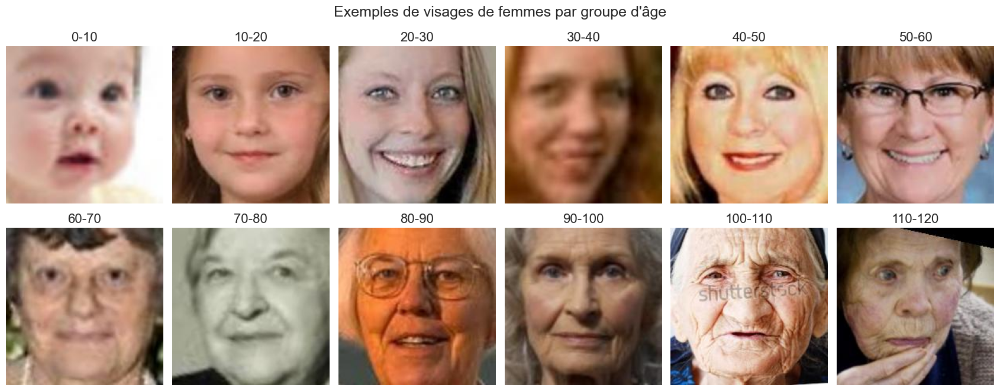

In [143]:
# Create a dictionary to store one example face for each age bin
example_faces = {i: None for i in range(len(age_bins))}

# Loop through the dataset and find the first image for each age bin and female faces only
for _, row in df.iterrows():
    age = row['age']
    gender = row['gender']
    if gender == 1: 
        for i, age_bin in enumerate(age_bins):
            if age >= age_bin[0] and age < age_bin[1]:
                if example_faces[i] is None:
                    example_faces[i] = preprocess_image(row)
                break

# Create subplots for each example face
fig, axes = plt.subplots(2, 6, figsize=(17, 7))

# Loop through each age bin and plot the example face
for i, ax in enumerate(axes.flatten()):
    if example_faces[i] is not None:
        face = example_faces[i]
        face = (face * 255).astype('uint8')
        ax.imshow(face)
        ax.set_title(f'{age_bins[i][0]}-{age_bins[i][1]}', size=16)
        ax.axis('off')
    else:
        ax.axis('off')

plt.suptitle('Exemples de visages de femmes par groupe d\'âge', fontsize=18)
plt.tight_layout()
plt.show()

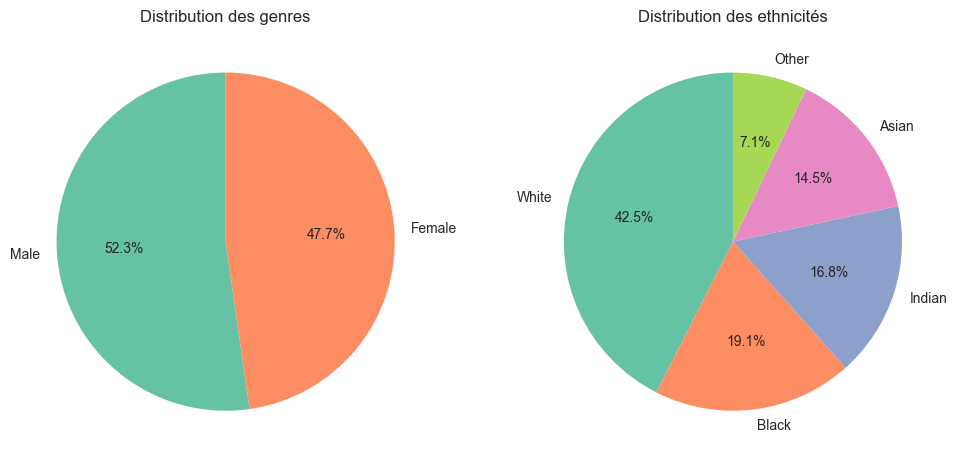

In [144]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Distribution des genres
gender_counts = df['gender'].value_counts().rename({0: 'Male', 1: 'Female'})
gender_counts.plot.pie(ax=ax1, autopct='%1.1f%%', startangle=90, colors=sns.color_palette("Set2", 2))
ax1.set_title("Distribution des genres")
ax1.set_ylabel("")

# Distribution des ethnies
ethnicity_counts = df['ethnicity'].value_counts().rename({
    0: 'White',
    1: 'Black',
    2: 'Asian',
    3: 'Indian',
    4: 'Other'
})
ethnicity_counts.plot.pie(ax=ax2, autopct='%1.1f%%', startangle=90, colors=sns.color_palette("Set2", 5))
ax2.set_title("Distribution des ethnicités")
ax2.set_ylabel("")

plt.show()

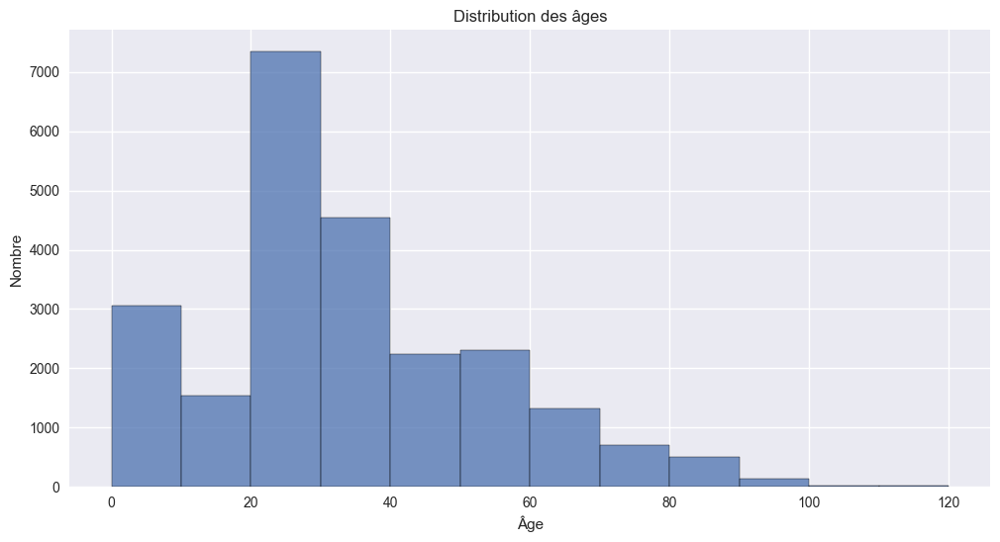

In [145]:
# Création d'une liste d'âges pour les bords de chaque bin
bin_edges = [age_bin[0] for age_bin in age_bins] + [age_bins[-1][-1]]

# Distribution des âges
plt.figure(figsize=(12, 6))
sns.histplot(df['age'], bins=bin_edges)
plt.title("Distribution des âges")
plt.xlabel("Âge")
plt.ylabel("Nombre")
plt.show()

https://arxiv.org/pdf/2203.13122v1.pdf

Comparativement aux jeunes, il est plus difficile d'estimer l'âge des personnes âgées ; il est plus facile de distinguer un enfant de 5 ans d'un enfant de 10 ans que de distinguer une personne de 65 ans d'une personne de 70 ans. 

Ainsi, pour l'estimation d'âge relative d'une personne âgée, il est plus efficace d'utiliser une fenêtre de recherche plus grande.

Le processus est modifié en remplaçant chaque âge θ par l'âge logarithmique log θ.

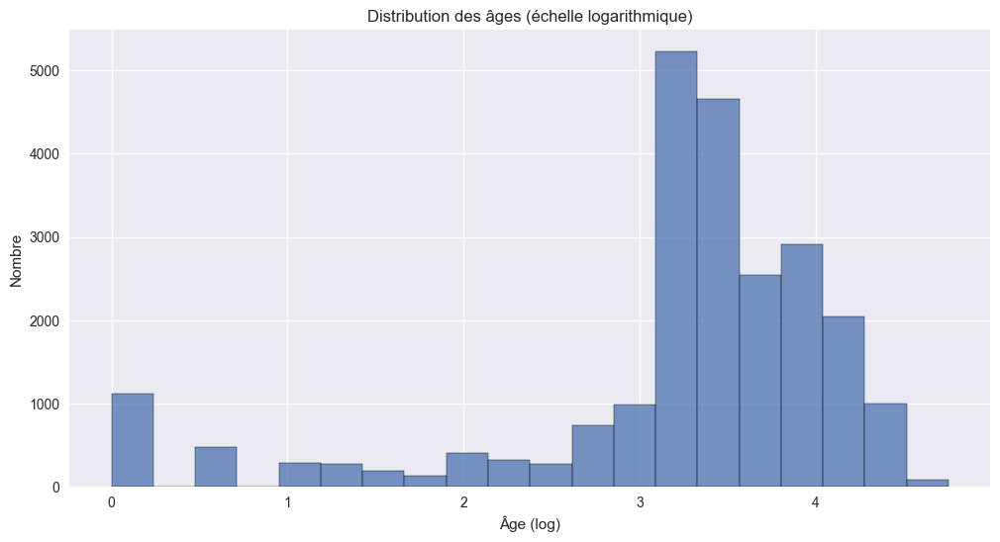

In [146]:
# Create new column with log-transformed age data
df['log_age'] = np.log(df['age'])

# Plot histogram of log-transformed age data
plt.figure(figsize=(12, 6))
sns.histplot(df['log_age'], bins=20)
plt.title("Distribution des âges (échelle logarithmique)")
plt.xlabel("Âge (log)")
plt.ylabel("Nombre")
plt.show()

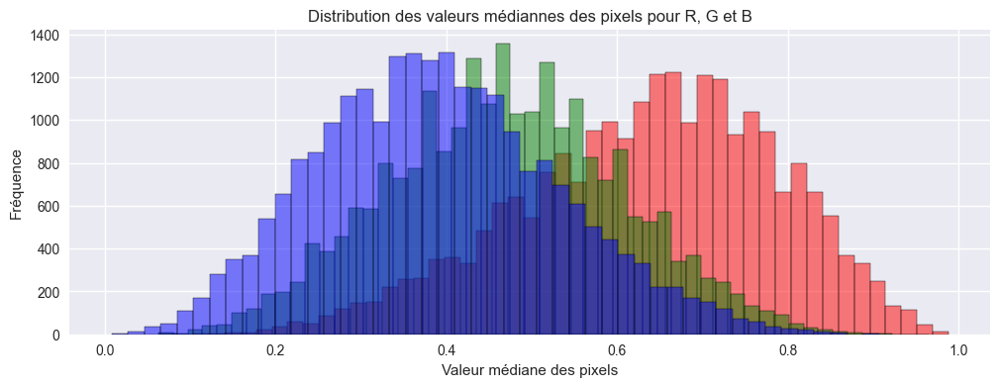

In [47]:
# Compute the median RGB values
medians_r = []
medians_g = []
medians_b = []
for _, row in df.iterrows():
    image = preprocess_image(row)
    medians_r.append(np.median(image[:, :, 0]))
    medians_g.append(np.median(image[:, :, 1]))
    medians_b.append(np.median(image[:, :, 2]))

# Plot the histograms using Seaborn
fig, ax = plt.subplots(figsize=(12, 4))
sns.histplot(data=medians_r, bins=50, kde=False, alpha=0.5, color='red')
sns.histplot(data=medians_g, bins=50, kde=False, alpha=0.5, color='green')
sns.histplot(data=medians_b, bins=50, kde=False, alpha=0.5, color='blue')
ax.set_xlabel('Valeur médiane des pixels')
ax.set_ylabel('Fréquence')
ax.set_title('Distribution des valeurs médiannes des pixels pour R, G et B')
plt.show()

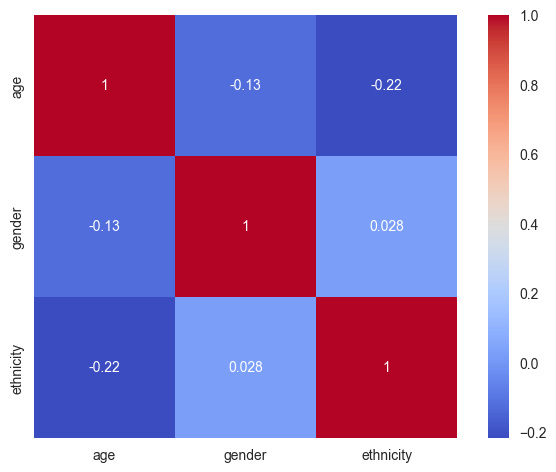

In [48]:
# Calculate the correlation matrix
corr_matrix = df[['age', 'gender', 'ethnicity']].corr()

# Create a heatmap of the correlation matrix
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', square=True)

# Show the plot
plt.show()

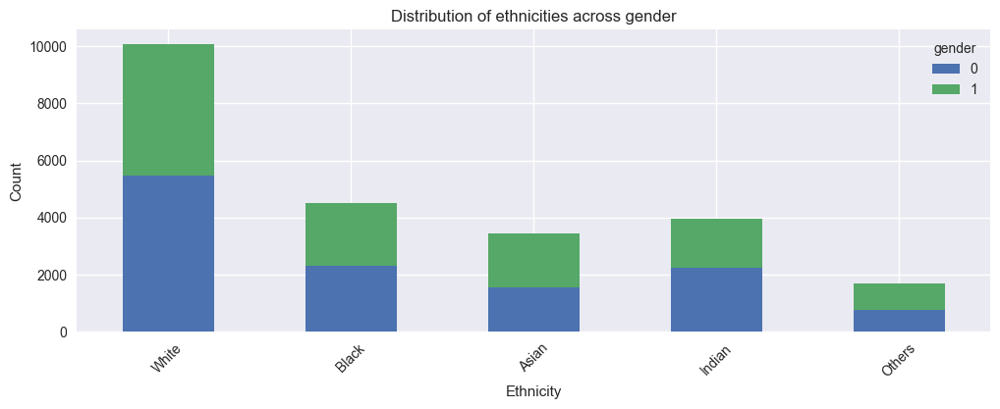

In [49]:
# Create a pivot table with the counts of each ethnicity/gender combination
ethnicity_gender_counts = df.pivot_table(index='ethnicity', columns='gender', values='image_path', aggfunc='count')

# Fill NaN values with zeros
ethnicity_gender_counts = ethnicity_gender_counts.fillna(0)

# Create a figure with custom size
fig, ax = plt.subplots(figsize=(12, 4))

# Create a stacked bar plot of the pivot table
ethnicity_gender_counts.plot(kind='bar', stacked=True, ax=ax)

# Set the title and axis labels
plt.title('Distribution of ethnicities across gender')
plt.xlabel('Ethnicity')
plt.ylabel('Count')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Update x-axis labels with the ethnicity mapping
ax.set_xticklabels([ethnicity_mapping[tick] for tick in ax.get_xticks()])

# Show the plot
plt.show()

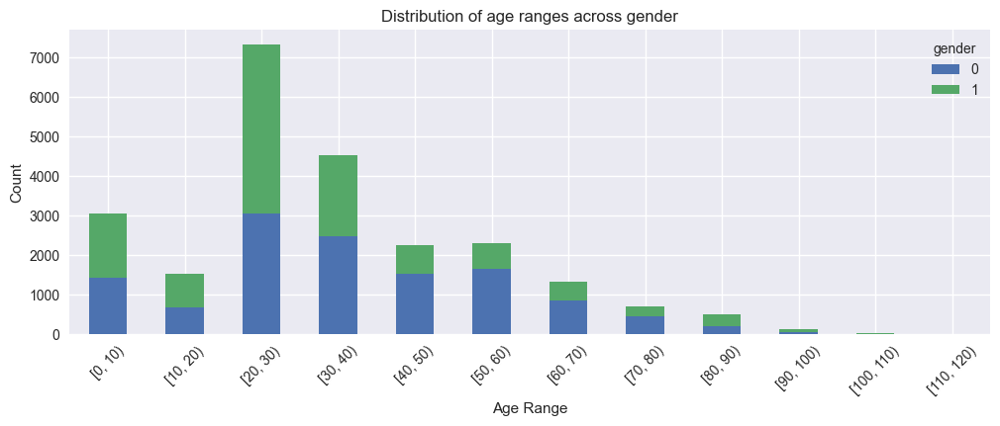

In [50]:
# Categorize ages into 10-year ranges
df['age_range'] = pd.cut(df['age'], bins=range(0, 121, 10), include_lowest=True, right=False)

# Create a pivot table with the counts of each age_range/gender combination
age_gender_counts = df.pivot_table(index='age_range', columns='gender', values='image_path', aggfunc='count')

# Fill NaN values with zeros
age_gender_counts = age_gender_counts.fillna(0)

# Create a figure with custom size
fig, ax = plt.subplots(figsize=(12, 4))

# Create a stacked bar plot of the pivot table
age_gender_counts.plot(kind='bar', stacked=True, ax=ax)

# Set the title and axis labels
plt.title('Distribution of age ranges across gender')
plt.xlabel('Age Range')
plt.ylabel('Count')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.show()

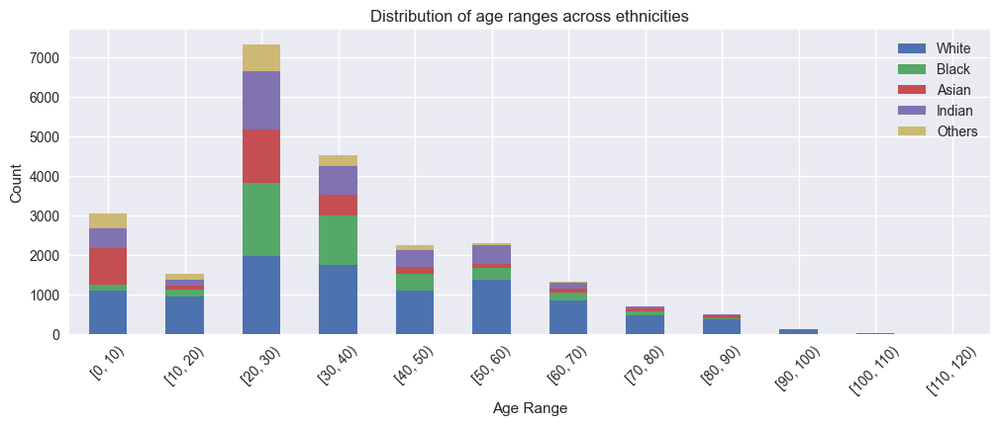

In [51]:
# Create a pivot table with the counts of each age_range/ethnicity combination
age_ethnicity_counts = df.pivot_table(index='age_range', columns='ethnicity', values='image_path', aggfunc='count')

# Fill NaN values with zeros
age_ethnicity_counts = age_ethnicity_counts.fillna(0)

# Update column names with the ethnicity mapping
age_ethnicity_counts.columns = [ethnicity_mapping[col] for col in age_ethnicity_counts.columns]

# Create a figure with custom size
fig, ax = plt.subplots(figsize=(12, 4))

# Create a stacked bar plot of the pivot table
age_ethnicity_counts.plot(kind='bar', stacked=True, ax=ax)

# Set the title and axis labels
plt.title('Distribution of age ranges across ethnicities')
plt.xlabel('Age Range')
plt.ylabel('Count')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.show()

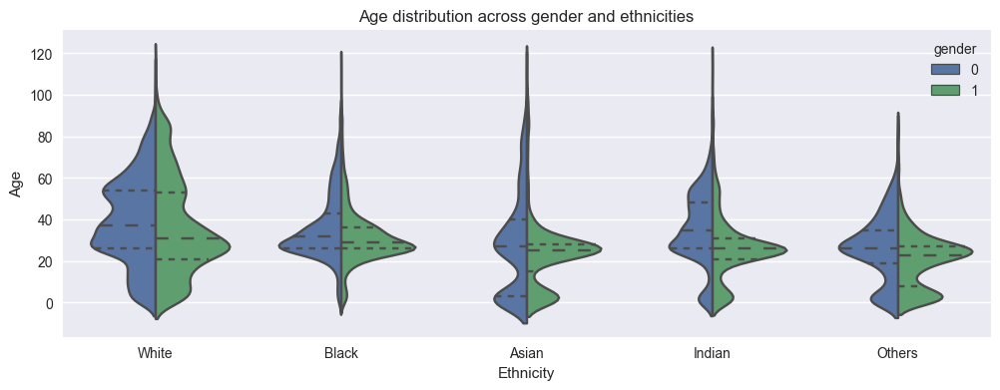

In [52]:
# Create a figure with custom size
fig, ax = plt.subplots(figsize=(12, 4))

# Create a violin plot of age distribution across gender and ethnicity
sns.violinplot(x='ethnicity', y='age', hue='gender', data=df, split=True, inner='quartile', ax=ax)

# Set the title and axis labels
plt.title('Age distribution across gender and ethnicities')
plt.xlabel('Ethnicity')
plt.ylabel('Age')

# Update x-axis labels with the ethnicity mapping
ax = plt.gca()
ax.set_xticklabels([ethnicity_mapping[tick] for tick in ax.get_xticks()])

# Show the plot
plt.show()

## <font color="#114b98" id="section_3">3. Préparation des données</font>

In [53]:
# Simplification du preprocessing 
def preprocessing(image_array):
    return image_array / 255.0

# Reset the index of the DataFrame
df = df.reset_index(drop=True)

# Split the DataFrame into train (70%) and a temporary test_val set (30%)
train_df, test_val_df = train_test_split(df, test_size=0.3, random_state=42)

# Split the test_val set into test (15%) and validation (15%) sets
test_df, val_df = train_test_split(test_val_df, test_size=0.5, random_state=42)

# Define the ImageDataGenerator for the train set with data augmentation
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocessing,
    rotation_range=5,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Create the train generator
train_generator = train_datagen.flow_from_dataframe(
    train_df,
    x_col='image_path',
    y_col=['log_age', 'gender', 'ethnicity'],
    target_size=image_size,
    batch_size=batch_size,
    class_mode='multi_output',
    color_mode="rgb",
    shuffle=True,
    seed=42,
)

# Define the ImageDataGenerator for the validation set
val_datagen = ImageDataGenerator(
    preprocessing_function=preprocessing
)

# Create the validation generator
val_generator = val_datagen.flow_from_dataframe(
    val_df,
    x_col='image_path',
    y_col=['log_age', 'gender', 'ethnicity'],
    target_size=image_size,
    batch_size=batch_size,
    class_mode='multi_output',
    color_mode="rgb",
    shuffle=True,
    seed=42,
)

# Define the ImageDataGenerator for the test set
test_datagen = ImageDataGenerator(
    preprocessing_function=preprocessing
)

# Create the test generator
test_generator = test_datagen.flow_from_dataframe(
    test_df,
    x_col='image_path',
    y_col=['log_age', 'gender', 'ethnicity'],
    target_size=image_size,
    batch_size=batch_size,
    class_mode='multi_output',
    color_mode="rgb",
    shuffle=True,
    seed=42,
)

Found 16583 validated image filenames.
Found 3554 validated image filenames.
Found 3553 validated image filenames.


In [54]:
total_samples = train_generator.n
print("Total samples:", total_samples)

Total samples: 16583


In [55]:
image_shape = train_generator.image_shape
print("Image shape:", image_shape)

Image shape: (200, 200, 3)


In [56]:
batch_size = train_generator.batch_size
print("Batch size:", batch_size)

Batch size: 32


In [57]:
number_of_batches = len(train_generator)
print("Number of batches:", number_of_batches)

Number of batches: 519


In [58]:
# Print the minimum and maximum pixel values
images, labels = next(train_generator)
print("Min pixel value:", np.min(images))
print("Max pixel value:", np.max(images))

Min pixel value: 0.0
Max pixel value: 1.0


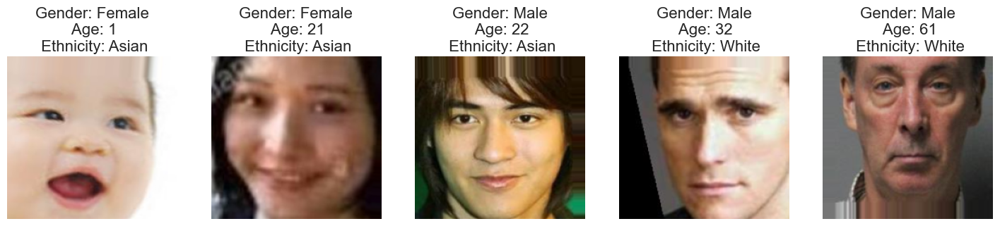

In [22]:
# Get a batch of images from the generator
images, labels = next(train_generator)

# Define a function to convert the gender and ethnicity labels to their string representations
def decode_labels(log_age, gender, ethnicity):
    gender_str = "Male" if gender == 0 else "Female"
    ethnicity_map = {
        0: 'White',
        1: 'Black',
        2: 'Asian',
        3: 'Indian',
        4: 'Other'}
    ethnicity_str = ethnicity_map[ethnicity]
    return f"Gender: {gender_str}\n Age: {int(np.exp(log_age))}\n Ethnicity: {ethnicity_str}"

# Plot the first five images in the batch
fig, axes = plt.subplots(1, 5, figsize=(18, 3))
for i in range(5):
    log_age, gender, ethnicity = labels[0][i], labels[1][i], labels[2][i]
    title = decode_labels(log_age, gender, ethnicity)
    axes[i].imshow(images[i], aspect='auto')
    axes[i].set_title(title, fontsize=16)
    axes[i].axis('off')
plt.show()

## <font color="#114b98" id="section_4">4. Modèle InceptionV3</font>

In [59]:
input_layer = Input(shape=(image_size[0], image_size[1], 3))

# Load the pre-trained InceptionV3 model
base_model = InceptionV3(
    weights='imagenet',
    include_top=False,
    input_tensor=input_layer 
)

'''Le fine-tuning total permet de réutiliser les features apprises
par InceptionV3 tout en entraînant la dernière couche fully-connected
sur le nouveau problème, ce qui permet de bénéficier d'une phase
d'apprentissage plus rapide que si l'initialisation avait été aléatoire.'''

# Unfreeze the pre-trained layers
for layer in base_model.layers:
    layer.trainable = True

# Add new classification layers
x = keras.layers.GlobalAveragePooling2D()(base_model.output)
x = keras.layers.Flatten()(x)

x_age = Dense(128, activation='relu')(x)
x_age = Dropout(0.5)(x_age)
output_age = Dense(1, activation='relu', name='age')(x_age)

x_gender = Dense(128, activation='relu')(x)
x_gender = Dropout(0.5)(x_gender)
output_gender = Dense(1, activation='sigmoid', name='gender')(x_gender)

x_ethnicity = Dense(128, activation='relu')(x)
x_ethnicity = Dropout(0.5)(x_ethnicity)
output_ethnicity = Dense(classes_ethnicite, activation='softmax', name='ethnicity')(x_ethnicity)

# Create the new model
model_inception = Model(inputs=input_layer,
                        outputs=[output_age, output_gender, output_ethnicity],
                        name="model_inception")

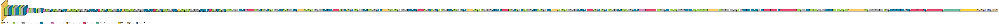

In [60]:
visualkeras.layered_view(model_inception, legend=True,  scale_xy=1, font=font, max_z=1000, color_map=color_map)

In [61]:
'''La perte des différentes sorties (âge, genre, ethnicité) ne sont pas 
directement comparables en termes d'unités ou de plage de valeurs. 
Pour prendre en compte cela, nous pouvons ajuster les pondérations de 
perte pour chaque sortie en fonction de leur importance relative. 
Dans ce cas, nous avons décidé de donner une pondération double à l'âge 
par rapport aux autres sorties. Cela signifie que la perte d'âge sera 
deux fois plus importante que les pertes de genre et d'ethnicité lors 
de l'entraînement du modèle.'''


model_inception.compile(
    optimizer=Adam(lr=0.00001),
    loss={
        'age': 'mae',
        'gender': 'binary_crossentropy',
        'ethnicity': 'sparse_categorical_crossentropy'
    },
    loss_weights={
        'age': 2.0,
        'gender': 1.0,
        'ethnicity': 1.0
    },
    metrics={
        'age': 'mae',
        'gender': 'accuracy',
        'ethnicity': 'accuracy'
    }
)

# Create the EarlyStopping callback
early_stopping = EarlyStopping(
    patience=5,
    monitor='val_loss',
    restore_best_weights=True)

In [26]:
EPOCHS = 25

# Train the model
history = model_inception.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=val_generator,
    callbacks=[early_stopping]
)

Epoch 1/25
519/519 [==============================] - 99s 170ms/step - loss: 4.1331 - age_loss: 0.9992 - gender_loss: 0.6628 - ethnicity_loss: 1.4720 - age_mae: 0.9992 - gender_accuracy: 0.6069 - ethnicity_accuracy: 0.3979 - val_loss: 2.9836 - val_age_loss: 0.5648 - val_gender_loss: 0.5734 - val_ethnicity_loss: 1.2807 - val_age_mae: 0.5648 - val_gender_accuracy: 0.7271 - val_ethnicity_accuracy: 0.4989
Epoch 2/25
519/519 [==============================] - 87s 168ms/step - loss: 3.2031 - age_loss: 0.6745 - gender_loss: 0.5697 - ethnicity_loss: 1.2845 - age_mae: 0.6745 - gender_accuracy: 0.7064 - ethnicity_accuracy: 0.5026 - val_loss: 2.5212 - val_age_loss: 0.4346 - val_gender_loss: 0.4910 - val_ethnicity_loss: 1.1610 - val_age_mae: 0.4346 - val_gender_accuracy: 0.7800 - val_ethnicity_accuracy: 0.5523
Epoch 3/25
519/519 [==============================] - 87s 167ms/step - loss: 2.8968 - age_loss: 0.6045 - gender_loss: 0.4998 - ethnicity_loss: 1.1880 - age_mae: 0.6045 - gender_accuracy: 0.7

519/519 [==============================] - 87s 167ms/step - loss: 1.5981 - age_loss: 0.4414 - gender_loss: 0.1950 - ethnicity_loss: 0.5203 - age_mae: 0.4414 - gender_accuracy: 0.9194 - ethnicity_accuracy: 0.8213 - val_loss: 1.2073 - val_age_loss: 0.2302 - val_gender_loss: 0.2089 - val_ethnicity_loss: 0.5380 - val_age_mae: 0.2302 - val_gender_accuracy: 0.9176 - val_ethnicity_accuracy: 0.8143
Epoch 22/25
519/519 [==============================] - 87s 168ms/step - loss: 1.5735 - age_loss: 0.4400 - gender_loss: 0.1858 - ethnicity_loss: 0.5077 - age_mae: 0.4400 - gender_accuracy: 0.9253 - ethnicity_accuracy: 0.8284 - val_loss: 1.2317 - val_age_loss: 0.2454 - val_gender_loss: 0.2060 - val_ethnicity_loss: 0.5350 - val_age_mae: 0.2454 - val_gender_accuracy: 0.9187 - val_ethnicity_accuracy: 0.8196
Epoch 23/25
519/519 [==============================] - 87s 168ms/step - loss: 1.5281 - age_loss: 0.4335 - gender_loss: 0.1773 - ethnicity_loss: 0.4838 - age_mae: 0.4335 - gender_accuracy: 0.9287 - eth

In [27]:
# model_inception.save(path + 'model_UTKFace_inception.h5')

In [28]:
model_inception = load_model(path + 'model_UTKFace_inception.h5')

In [62]:
def plot_epochs(history):
    fig, ax = plt.subplots(2, 3, figsize=(18, 10))

    # Age
    ax[0, 0].plot([np.exp(x) for x in history.history['age_mae']])
    ax[0, 0].plot([np.exp(x) for x in history.history['val_age_mae']])
    ax[0, 0].set_title('Age Model MAE', size=16)
    ax[0, 0].set_ylabel('Mean Absolute Error')
    ax[0, 0].legend(['Train', 'Validation'], loc='upper left')

    ax[1, 0].plot(history.history['age_loss'])
    ax[1, 0].plot(history.history['val_age_loss'])
    ax[1, 0].set_title('Age Model Loss', size=16)
    ax[1, 0].set_ylabel('Loss')
    ax[1, 0].legend(['Train', 'Validation'], loc='upper right')

    # Gender
    ax[0, 1].plot(history.history['gender_accuracy'])
    ax[0, 1].plot(history.history['val_gender_accuracy'])
    ax[0, 1].set_title('Gender Model Accuracy', size=16)
    ax[0, 1].set_ylabel('Accuracy')
    ax[0, 1].legend(['Train', 'Validation'], loc='upper left')

    ax[1, 1].plot(history.history['gender_loss'])
    ax[1, 1].plot(history.history['val_gender_loss'])
    ax[1, 1].set_title('Gender Model Loss', size=16)
    ax[1, 1].set_ylabel('Loss')
    ax[1, 1].legend(['Train', 'Validation'], loc='upper right')

    # Ethnicity
    ax[0, 2].plot(history.history['ethnicity_accuracy'])
    ax[0, 2].plot(history.history['val_ethnicity_accuracy'])
    ax[0, 2].set_title('Ethnicity Model Accuracy', size=16)
    ax[0, 2].set_ylabel('Accuracy')
    ax[0, 2].legend(['Train', 'Validation'], loc='upper left')

    ax[1, 2].plot(history.history['ethnicity_loss'])
    ax[1, 2].plot(history.history['val_ethnicity_loss'])
    ax[1, 2].set_title('Ethnicity Model Loss', size=16)
    ax[1, 2].set_ylabel('Loss')
    ax[1, 2].legend(['Train', 'Validation'], loc='upper right')

    # Set x-axis labels
    for i in range(2):
        for j in range(3):
            ax[i, j].set_xlabel('Epoch')
            ax[i, j].xaxis.set_major_locator(ticker.MaxNLocator(integer=True))

    plt.tight_layout()
    plt.show()

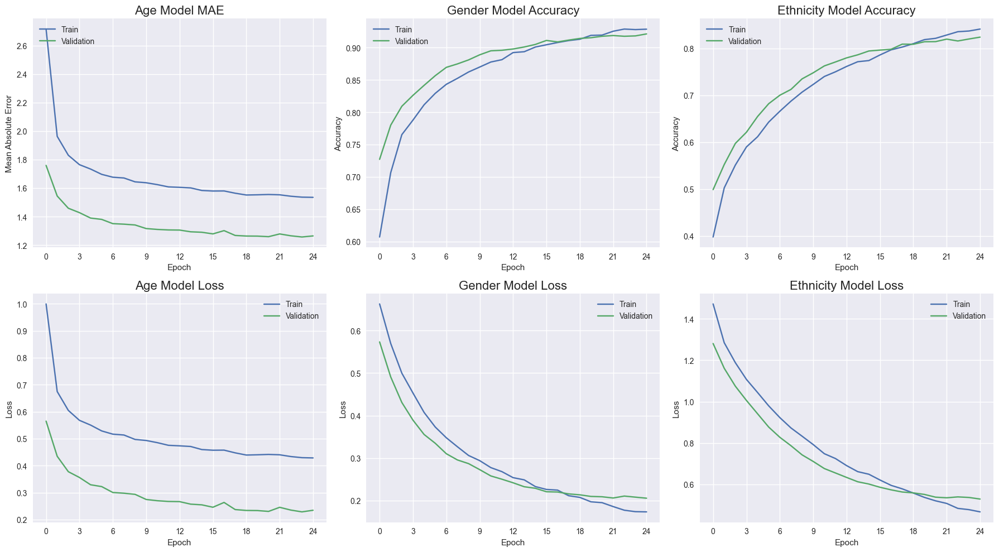

In [30]:
# Plot the training history
plot_epochs(history)

In [31]:
# Evaluate the model
loss, age_loss, gender_loss, ethnicity_loss, age_mae_log, gender_acc, ethnicity_acc = model_inception.evaluate(test_generator)

age_mae_actual = np.exp(age_mae_log)

dict_age_mae['FT'] = age_mae_actual
dict_gender_accuracy['FT'] = gender_acc
dict_ethnicity_accuracy['FT'] = ethnicity_acc

print(f'Validation loss: {loss:.4f}')
print(f'Age loss: {age_loss:.4f}')
print(f'Gender loss: {gender_loss:.4f}')
print(f'Ethnicity loss: {ethnicity_loss:.4f}')
print(f'Age mean absolute error: {age_mae_actual:.4f}')
print(f'Gender accuracy: {gender_acc:.4f}')
print(f'Ethnicity accuracy: {ethnicity_acc:.4f}')

112/112 [==============================] - 7s 48ms/step - loss: 1.1700 - age_loss: 0.2342 - gender_loss: 0.1866 - ethnicity_loss: 0.5149 - age_mae: 0.2342 - gender_accuracy: 0.9249 - ethnicity_accuracy: 0.8218
Validation loss: 1.1700
Age loss: 0.2342
Gender loss: 0.1866
Ethnicity loss: 0.5149
Age mean absolute error: 1.2639
Gender accuracy: 0.9249
Ethnicity accuracy: 0.8218


In [32]:
# Recherche des hyperparamètres les plus performants

In [33]:
# Define the model builder function for Keras Tuner
def build_model(hp):
    input_layer = Input(shape=(image_size[0], image_size[1], 3))

    base_model = InceptionV3(
        weights='imagenet',
        include_top=False,
        input_tensor=input_layer
    )

    # Add hyperparameter for the percentage of frozen layers
    freeze_percentage = hp.Choice('freeze_percentage', [0, 25, 75, 100])
    num_layers = len(base_model.layers)
    num_frozen_layers = int((freeze_percentage / 100) * num_layers)

    for layer in base_model.layers[:num_frozen_layers]:
        layer.trainable = False
    for layer in base_model.layers[num_frozen_layers:]:
        layer.trainable = True

    x = keras.layers.GlobalAveragePooling2D()(base_model.output)
    x = keras.layers.Flatten()(x)

    dense_size = hp.Choice('dense_size', [512, 1024, 2048, 4096])
    dropout_rate = hp.Choice('dropout_rate', [0.1, 0.2, 0.3, 0.4])

    x_age = Dense(dense_size, activation='relu')(x)
    x_age = Dropout(dropout_rate)(x_age)
    output_age = Dense(1, activation='relu', name='age')(x_age)

    x_gender = Dense(dense_size, activation='relu')(x)
    x_gender = Dropout(dropout_rate)(x_gender)
    output_gender = Dense(1, activation='sigmoid', name='gender')(x_gender)

    x_ethnicity = Dense(dense_size, activation='relu')(x)
    x_ethnicity = Dropout(dropout_rate)(x_ethnicity)
    output_ethnicity = Dense(classes_ethnicite, activation='softmax', name='ethnicity')(x_ethnicity)

    model = Model(inputs=input_layer, 
                  outputs=[output_age, output_gender, output_ethnicity],
                  name="model_incep_hyper")

    # Add learning rate as a hyperparameter
    learning_rate = hp.Choice('learning_rate', [0.00005, 0.0001, 0.0005, 0.001])
    
    # Compile the model
    model.compile(
        optimizer=Adam(lr=learning_rate),
        loss={
            'age': 'mae',
            'gender': 'binary_crossentropy',
            'ethnicity': 'sparse_categorical_crossentropy'
        },
        loss_weights={
            'age': 2.0,
            'gender': 1.0,
            'ethnicity': 1.0
        },
        metrics={
            'age': 'mae',
            'gender': 'accuracy',
            'ethnicity': 'accuracy'
        }
    )
    return model

# Define the objectives as keras_tuner.Objective instances
age_mae_objective = Objective(name="val_age_mae", direction="min")
gender_accuracy_objective = Objective(name="val_gender_accuracy", direction="max")
ethnicity_accuracy_objective = Objective(name="val_ethnicity_accuracy", direction="max")


def build_callbacks():
    return [EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)]
 

tuner = BayesianOptimization(
    build_model,
    objective=[age_mae_objective, gender_accuracy_objective, ethnicity_accuracy_objective],
    max_trials=16,
    num_initial_points=3,
    directory="keras_tuner",
    project_name="tuner",
    overwrite=True
)

# Search for the best model
tuner.search(train_generator,
             epochs=EPOCHS,
             validation_data=val_generator,
             callbacks=[build_callbacks()])

Trial 16 Complete [00h 35m 25s]
multi_objective: -1.256417453289032

Best multi_objective So Far: -1.5629141628742218
Total elapsed time: 06h 54m 16s
INFO:tensorflow:Oracle triggered exit


In [37]:
# Print the best hyperparameters
print("Best hyperparameters:", tuner.get_best_hyperparameters()[0].values)

# Get the best hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

# with open(path + "best_hyperparameters_incep_hyper.pkl", "wb") as f:
#     pickle.dump(best_hps, f)

Best hyperparameters: {'freeze_percentage': 0, 'dense_size': 2048, 'dropout_rate': 0.3, 'learning_rate': 5e-05}


In [38]:
with open(path + "best_hyperparameters_incep_hyper.pkl", "rb") as f:
    loaded_best_hps = pickle.load(f)

# Build the model with the best hyperparameters
model_incep_hyper = build_model(loaded_best_hps)    

In [39]:
# Train the model
history = model_incep_hyper.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=val_generator,
    callbacks=[early_stopping]
)

Epoch 1/25
519/519 [==============================] - 100s 178ms/step - loss: 2.6267 - age_loss: 0.5243 - gender_loss: 0.4785 - ethnicity_loss: 1.0997 - age_mae: 0.5242 - gender_accuracy: 0.7622 - ethnicity_accuracy: 0.5811 - val_loss: 1.8529 - val_age_loss: 0.3144 - val_gender_loss: 0.3661 - val_ethnicity_loss: 0.8580 - val_age_mae: 0.3144 - val_gender_accuracy: 0.8343 - val_ethnicity_accuracy: 0.6882
Epoch 2/25
519/519 [==============================] - 91s 175ms/step - loss: 1.7914 - age_loss: 0.3437 - gender_loss: 0.3166 - ethnicity_loss: 0.7873 - age_mae: 0.3437 - gender_accuracy: 0.8630 - ethnicity_accuracy: 0.7170 - val_loss: 1.4865 - val_age_loss: 0.2825 - val_gender_loss: 0.2553 - val_ethnicity_loss: 0.6660 - val_age_mae: 0.2825 - val_gender_accuracy: 0.8911 - val_ethnicity_accuracy: 0.7648
Epoch 3/25
519/519 [==============================] - 91s 175ms/step - loss: 1.5303 - age_loss: 0.3128 - gender_loss: 0.2594 - ethnicity_loss: 0.6452 - age_mae: 0.3128 - gender_accuracy: 0.

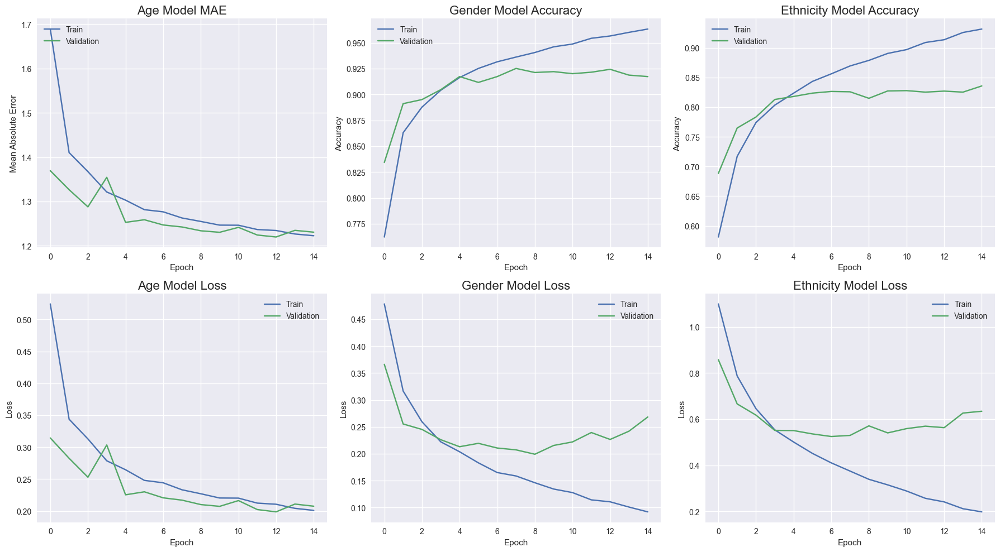

In [40]:
plot_epochs(history)

In [41]:
# model_incep_hyper.save(path + 'model_UTKFace_inception_hyper.h5')

In [86]:
model_incep_hyper = load_model(path + 'model_UTKFace_inception_hyper.h5')

In [43]:
# Evaluate the model
loss, age_loss, gender_loss, ethnicity_loss, age_mae_log, gender_acc, ethnicity_acc = model_incep_hyper.evaluate(test_generator)

age_mae_actual = np.exp(age_mae_log)

dict_age_mae['HS'] = age_mae_actual
dict_gender_accuracy['HS'] = gender_acc
dict_ethnicity_accuracy['HS'] = ethnicity_acc

print(f'Validation loss: {loss:.4f}')
print(f'Age loss: {age_loss:.4f}')
print(f'Gender loss: {gender_loss:.4f}')
print(f'Ethnicity loss: {ethnicity_loss:.4f}')
print(f'Age mean absolute error: {age_mae_actual:.4f}')
print(f'Gender accuracy: {gender_acc:.4f}')
print(f'Ethnicity accuracy: {ethnicity_acc:.4f}')

112/112 [==============================] - 6s 47ms/step - loss: 1.1195 - age_loss: 0.2099 - gender_loss: 0.1799 - ethnicity_loss: 0.5198 - age_mae: 0.2099 - gender_accuracy: 0.9322 - ethnicity_accuracy: 0.8323
Validation loss: 1.1195
Age loss: 0.2099
Gender loss: 0.1799
Ethnicity loss: 0.5198
Age mean absolute error: 1.2335
Gender accuracy: 0.9322
Ethnicity accuracy: 0.8323


In [76]:
def plot_comparison(dict_age_mae, dict_gender_accuracy, dict_ethnicity_accuracy):
    num_subplots = 3
    fig, axs = plt.subplots(nrows=1, ncols=num_subplots, figsize=(16, 8))
    dict_list = [dict_age_mae, dict_gender_accuracy, dict_ethnicity_accuracy]
    labels_list = ['Age MAE', 'Gender Accuracy', 'Ethnicity Accuracy']
    
    # create a custom color palette with four colors
    custom_palette_4 = sns.color_palette(['#F08080', '#E83E3E', '#83D9AD', '#34AB6E'])
    
    for i in range(num_subplots):
        dict_data = dict_list[i]
        labels = list(dict_data.keys())
        values = list(dict_data.values())
        sns.barplot(x=labels, y=values, palette=custom_palette_4, ax=axs[i])
        axs[i].set_ylabel(labels_list[i], fontsize=16)
        axs[i].set_title(labels_list[i], fontsize=16)
        for j, v in enumerate(values):
            axs[i].text(j, v + 0.01, str(round(v, 3)), ha='center')
        axs[i].set_xticklabels(labels, fontsize=14)
    plt.tight_layout()
    plt.show()

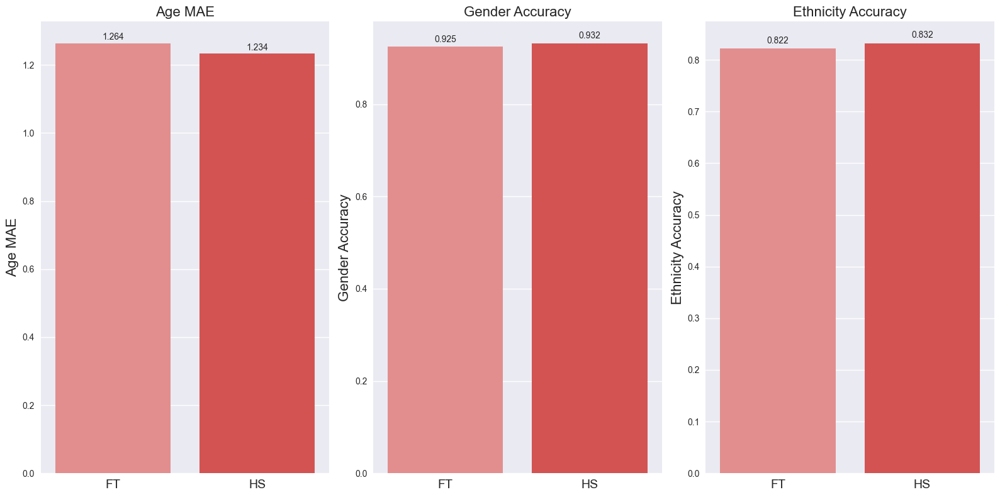

In [45]:
plot_comparison(dict_age_mae, dict_gender_accuracy, dict_ethnicity_accuracy)

1/1 [==============================] - 1s 1s/step


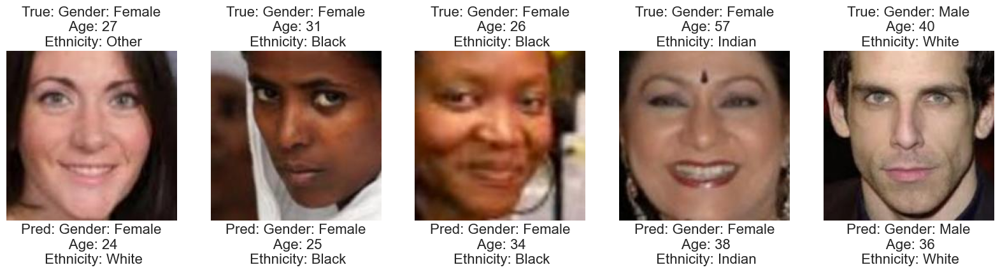

In [46]:
# Get a batch of images and labels from the test_generator
test_images, test_labels = next(test_generator)

# Get the predictions for the test images
predictions = model_incep_hyper.predict(test_images)

# Define a function to convert the gender and ethnicity labels to their string representations
def decode_labels(age, gender, ethnicity):
    gender_str = "Male" if gender < 0.5 else "Female"
    ethnicity_map = {
        0: 'White',
        1: 'Black',
        2: 'Asian',
        3: 'Indian',
        4: 'Other'}
    ethnicity_str = ethnicity_map[ethnicity]
    return f"Gender: {gender_str}\n Age: {int(np.exp(age))}\n Ethnicity: {ethnicity_str}"

# Plot the first five images in the batch
fig, axes = plt.subplots(1, 5, figsize=(20, 8))
for i in range(5):
    true_age, true_gender, true_ethnicity = test_labels[0][i], test_labels[1][i], test_labels[2][i]
    true_title = decode_labels(true_age, true_gender, true_ethnicity)

    pred_age, pred_gender, pred_ethnicity = predictions[0][i][0], predictions[1][i][0], np.argmax(predictions[2][i])
    pred_title = decode_labels(pred_age, pred_gender, pred_ethnicity)
    
    axes[i].imshow(test_images[i], cmap='gray')
    axes[i].set_title(f'True: {true_title}', fontsize=16)
    axes[i].axis('off')
    axes[i].text(0.5, -0.25, f'Pred: {pred_title}', size=16, ha="center", transform=axes[i].transAxes)
plt.show()

In [87]:
def get_true_and_pred_labels(test_generator, model):
    true_age_labels = []
    true_gender_labels = []
    true_ethnicity_labels = []

    pred_age_labels = []
    pred_gender_labels = []
    pred_ethnicity_labels = []

    for i, (images, labels) in enumerate(test_generator):

        true_age_labels.extend(np.round(np.exp(labels[0])).astype(int).tolist())
        true_gender_labels.extend(np.round(labels[1]).astype(int).tolist())
        true_ethnicity_labels.extend(labels[2].tolist())

        preds = model.predict(images)

        pred_age_labels.extend(np.round(np.exp(preds[0])).astype(int).tolist())
        pred_gender_labels.extend((preds[1] > 0.5).astype(int).tolist())
        pred_ethnicity_labels.extend(np.argmax(preds[2], axis=-1).tolist())
        
        if i+1 >= test_generator.n // test_generator.batch_size:
            break
    
    pred_age_labels = np.squeeze(pred_age_labels).tolist()
    pred_age_labels = np.clip(pred_age_labels, 1, None)
    pred_gender_labels = np.squeeze(pred_gender_labels).tolist()
    
    true_labels = np.vstack([true_age_labels, true_gender_labels, true_ethnicity_labels])
    pred_labels = np.vstack([pred_age_labels, pred_gender_labels, pred_ethnicity_labels])
    return true_labels, pred_labels

true_labels, pred_labels = get_true_and_pred_labels(test_generator, model_incep_hyper)

1/1 [==============================] - 0s 27ms/step


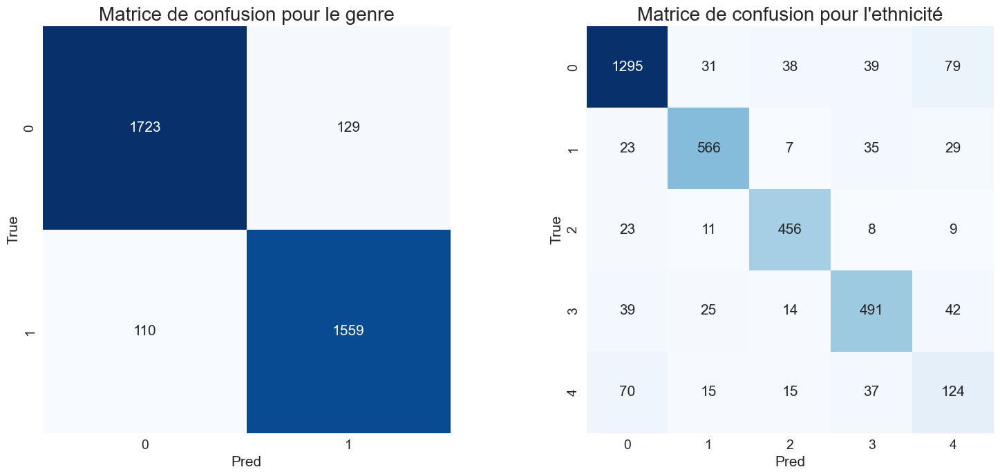

In [48]:
def plot_confusion_matrices(true_labels, pred_labels, titles):
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 7))
    
    for i, ax in enumerate(axes.flat):
        cm = confusion_matrix(true_labels[i + 1, :], pred_labels[i + 1, :])
        heatmap = sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', square=True, cbar=False,
                              annot_kws={"fontsize": 15}, ax=ax)
        heatmap.set_xlabel('Pred', fontsize=15)
        heatmap.set_ylabel('True', fontsize=15)
        heatmap.set_title(titles[i], fontsize=20)
        heatmap.set_xticklabels(heatmap.get_xticklabels(), fontsize=14)
        heatmap.set_yticklabels(heatmap.get_yticklabels(), fontsize=14)
    
    plt.tight_layout()
    plt.show()

titles = ['Matrice de confusion pour le genre', 'Matrice de confusion pour l\'ethnicité']
plot_confusion_matrices(true_labels, pred_labels, titles)

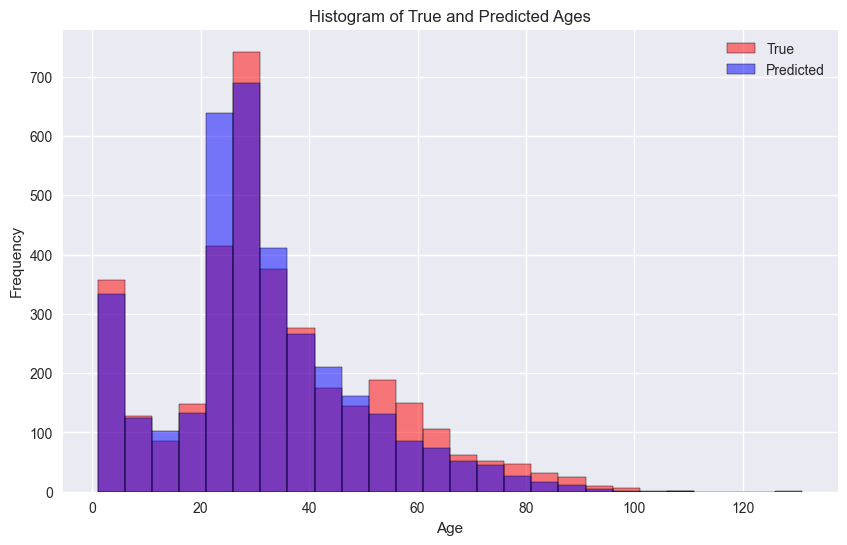

In [49]:
# Plot histogram of true and predicted ages
plt.figure(figsize=(10, 6))
sns.histplot(true_labels[0], binwidth=5, color='red', alpha=0.5, label='True')
sns.histplot(pred_labels[0], binwidth=5, color='blue', alpha=0.5, label='Predicted')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Histogram of True and Predicted Ages')
plt.legend()
plt.show()

In [50]:
# Create a dictionary to store the counts for each label
counts = {'True Male': 0, 'Predicted Male': 0, 'True Female': 0, 'Predicted Female': 0}

# Loop over the true and predicted labels and update the counts accordingly
for true_label, pred_label in zip(true_labels[1], pred_labels[1]):
    if true_label == 0:
        counts['True Male'] += 1
    else:
        counts['True Female'] += 1
    if pred_label == 0:
        counts['Predicted Male'] += 1
    else:
        counts['Predicted Female'] += 1

# Compute the total number of samples
n_samples = len(true_labels[1])

# Create a bar plot with plotly
fig = go.Figure()
fig.add_trace(go.Bar(
    x=list(counts.keys()),
    y=[counts[label]/n_samples for label in counts],
    marker_color=['red', 'blue', 'red', 'blue'],
    opacity=0.5,
    text=[f'{label}: {counts[label]}' for label in counts],
    textposition='auto',
))
fig.update_layout(
    title='Histogram of True and Predicted Genders',
    xaxis_title='Gender',
    yaxis_title='Frequency',
    showlegend=False,
    bargap=0.2,
    height=400,
)

fig.show()

In [51]:
# Compute the frequency counts for true and predicted ethnicities
true_counts = [(true_labels[2] == i).sum() for i in range(5)]
pred_counts = [(pred_labels[2] == i).sum() for i in range(5)]
total_counts = sum(true_counts)

true_freq = [count / total_counts for count in true_counts]
pred_freq = [count / total_counts for count in pred_counts]

# Create a bar plot with plotly
fig = go.Figure()
fig.add_trace(go.Bar(
    x=['White', 'Black', 'Asian', 'Indian', 'Other'],
    y=true_freq,
    marker_color='red',
    opacity=0.5,
    name='True'
))
fig.add_trace(go.Bar(
    x=['White', 'Black', 'Asian', 'Indian', 'Other'],
    y=pred_freq,
    marker_color='blue',
    opacity=0.5,
    name='Predicted'
))

fig.update_layout(
    title='Histogram of True and Predicted Ethnicities',
    xaxis_title='Predicted Ethnicity',
    yaxis_title='Frequency',
    showlegend=True,
    bargap=0.2,
    height=400,
)

fig.show()

## <font color="#114b98" id="section_5">5. Solutions pour le déséquilibre de classes</font>

In [64]:
# https://github.com/orparask/VS-Loss
# https://arxiv.org/abs/2103.01550

'''
VSLoss is a custom loss function for deep learning models that 
aims to address class imbalance in classification tasks. 

The loss function is defined using the variance of softmax logits, 
where classes with low representation receive higher weight in 
the loss calculation. 

The gamma and tau hyperparameters control the strength of the 
weighting and the degree of variance normalization. The cls_num_list 
parameter is a list of class frequencies in the training set, 
used to calculate the class probabilities and weights. 

Overall, VSLoss is useful for improving the performance of models 
trained on imbalanced datasets.
'''

class VSLoss(tf.keras.losses.Loss):
    def __init__(self, cls_num_list, gamma=0.3, tau=1.0, weight=None, reduction=tf.keras.losses.Reduction.AUTO, **kwargs):
        super(VSLoss, self).__init__(reduction=reduction, **kwargs)
        
        cls_probs = [cls_num / sum(cls_num_list) for cls_num in cls_num_list]
        temp = (1.0 / np.array(cls_num_list)) ** gamma
        temp = temp / np.min(temp)

        iota_list = tau * np.log(cls_probs)
        Delta_list = temp

        self.cls_num_list = cls_num_list
        self.gamma = gamma
        self.tau = tau
        self.weight = weight
        self.iota_list = tf.convert_to_tensor(iota_list, dtype=tf.float32)
        self.Delta_list = tf.convert_to_tensor(Delta_list, dtype=tf.float32)

    def get_config(self):
        config = super(VSLoss, self).get_config()
        config.update({
            'cls_num_list': self.cls_num_list,
            'gamma': self.gamma,
            'tau': self.tau,
            'weight': self.weight,
        })
        return config    
        
    def call(self, y_true, y_pred):
        y_true = tf.cast(y_true, tf.int32)

        y_pred = tf.cast(y_pred, self.Delta_list.dtype)
        output = y_pred / self.Delta_list + self.iota_list

        return tf.keras.losses.sparse_categorical_crossentropy(y_true, output, from_logits=True)


# Extract the unique class labels from the 'ethnicity' column in the train_df DataFrame
unique_classes_train = train_df['ethnicity'].unique()

# Sort the unique class labels
unique_classes_train_sorted = np.sort(unique_classes_train)

# Calculate the class frequencies based on the sorted unique class labels
cls_num_list = train_df['ethnicity'].value_counts().loc[unique_classes_train_sorted].values

ethnicity_loss = VSLoss(cls_num_list)

In [65]:
# https://github.com/SteiMi/denseweight
# https://link.springer.com/article/10.1007/s10994-021-06023-5

'''
DenseWeight is a Python package that calculates class weights 
for imbalanced classification problems. The class weights are 
used to adjust the contribution of each class during training, 
where the less represented classes receive higher weights. 

The alpha parameter controls the degree of weighting, where 
alpha > 1 increases the weight of the minority classes, while 
alpha < 1 decreases their weight.

When dealing with highly imbalanced datasets, increasing the 
alpha parameter in DenseWeight will increase the weight of the 
minority classes during training, which can help to balance the 
class distribution and improve model performance. Therefore, 
it's recommended to increase the alpha value when the class 
imbalance is severe. 
'''

from denseweight import DenseWeight

# Reset the index of the DataFrame
df = df.reset_index(drop=True)

# Extract the target variable
y = df['log_age']                          # faire sur age ou log_age ?

# Reshape y to a 1D array
y = np.ravel(y)

# Calculate class weights using DenseWeight
dw = DenseWeight(alpha=1.1)
weights = dw.fit(y)

In [66]:
# Split the DataFrame into train (70%) and a temporary test_val set (30%)
train_df, test_val_df, train_weights, test_val_weights = train_test_split(df,
                                                                          weights,
                                                                          test_size=0.3,
                                                                          random_state=42)

# Split the test_val set into test (15%) and validation (15%) sets
test_df, val_df, test_weights, val_weights  = train_test_split(test_val_df,
                                                               test_val_weights,
                                                               test_size=0.5,
                                                               random_state=42)


# Get the weights for the train set
train_weights = weights[train_df.index]

# Create the train generator
train_generator_ = train_datagen.flow_from_dataframe(
    train_df,
    x_col='image_path',
    y_col=['log_age', 'gender', 'ethnicity'],
    target_size=image_size,
    batch_size=batch_size,
    class_mode='multi_output',
    color_mode="rgb",
    shuffle=True,
    seed=42,
    sample_weight=train_weights
)

# Get the weights for the validation set and reindex to match the val_df DataFrame
weights_val = weights[val_df.index]

# Create the validation generator
val_generator_ = val_datagen.flow_from_dataframe(
    val_df,
    x_col='image_path',
    y_col=['log_age', 'gender', 'ethnicity'],
    target_size=image_size,
    batch_size=batch_size,
    class_mode='multi_output',
    color_mode="rgb",
    shuffle=True,
    seed=42,
    sample_weight=weights_val
)


# Get the weights for the test set
weights_test = weights[test_df.index]

# Create the test generator
test_generator_ = test_datagen.flow_from_dataframe(
    test_df,
    x_col='image_path',
    y_col=['log_age', 'gender', 'ethnicity'],
    target_size=image_size,
    batch_size=batch_size,
    class_mode='multi_output',
    color_mode="rgb",
    shuffle=True,
    seed=42,
    sample_weight=weights_test
)

Found 16583 validated image filenames.
Found 3554 validated image filenames.
Found 3553 validated image filenames.


In [55]:
# Unfreeze the pre-trained layers
for layer in base_model.layers:
    layer.trainable = True

# Add new classification layers
x = keras.layers.GlobalAveragePooling2D()(base_model.output)
x = keras.layers.Flatten()(x)

x_age = Dense(128, activation='relu')(x)
x_age = Dropout(0.5)(x_age)
output_age = Dense(1, activation='relu', name='age')(x_age)

x_gender = Dense(128, activation='relu')(x)
x_gender = Dropout(0.5)(x_gender)
output_gender = Dense(1, activation='sigmoid', name='gender')(x_gender)

x_ethnicity = Dense(128, activation='relu')(x)
x_ethnicity = Dropout(0.5)(x_ethnicity)
output_ethnicity = Dense(classes_ethnicite, activation='softmax', name='ethnicity')(x_ethnicity)

# Create the new model
model_incep_imba = Model(inputs=input_layer,
                         outputs=[output_age, output_gender, output_ethnicity],
                         name="model_incep_imba")

model_incep_imba.compile(
    optimizer=Adam(lr=0.0001),
    loss={
        'age': 'mae',
        'gender': 'binary_crossentropy',
        'ethnicity': ethnicity_loss
    },
    loss_weights={
        'age': 2.0,
        'gender': 1.0,
        'ethnicity': 1.0
    },
    metrics={
        'age': 'mae',
        'gender': 'accuracy',
        'ethnicity': 'accuracy'
    }
)

In [56]:
# Train the model
history = model_incep_imba.fit(
    train_generator_,
    epochs=EPOCHS,
    validation_data=val_generator_,
    callbacks=[early_stopping]
)

Epoch 1/25
519/519 [==============================] - 99s 176ms/step - loss: 2.5734 - age_loss: 0.5823 - gender_loss: 0.2544 - ethnicity_loss: 1.1544 - age_mae: 0.5823 - gender_accuracy: 0.8921 - ethnicity_accuracy: 0.7372 - val_loss: 1.9038 - val_age_loss: 0.2819 - val_gender_loss: 0.2290 - val_ethnicity_loss: 1.1109 - val_age_mae: 0.2819 - val_gender_accuracy: 0.9074 - val_ethnicity_accuracy: 0.7642
Epoch 2/25
519/519 [==============================] - 91s 175ms/step - loss: 2.2886 - age_loss: 0.4891 - gender_loss: 0.2068 - ethnicity_loss: 1.1036 - age_mae: 0.4891 - gender_accuracy: 0.9159 - ethnicity_accuracy: 0.7819 - val_loss: 1.8314 - val_age_loss: 0.2638 - val_gender_loss: 0.2121 - val_ethnicity_loss: 1.0918 - val_age_mae: 0.2638 - val_gender_accuracy: 0.9131 - val_ethnicity_accuracy: 0.7943
Epoch 3/25
519/519 [==============================] - 91s 174ms/step - loss: 2.2166 - age_loss: 0.4645 - gender_loss: 0.1939 - ethnicity_loss: 1.0937 - age_mae: 0.4645 - gender_accuracy: 0.9

In [57]:
# model_incep_imba.save(path + 'model_UTKFace_inception_imba.h5')

In [58]:
# Define a dictionary containing the custom objects
custom_objects = {'VSLoss': VSLoss}

# Load the model with the custom objects
model_incep_imba = load_model(path + 'model_UTKFace_inception_imba.h5', custom_objects=custom_objects)

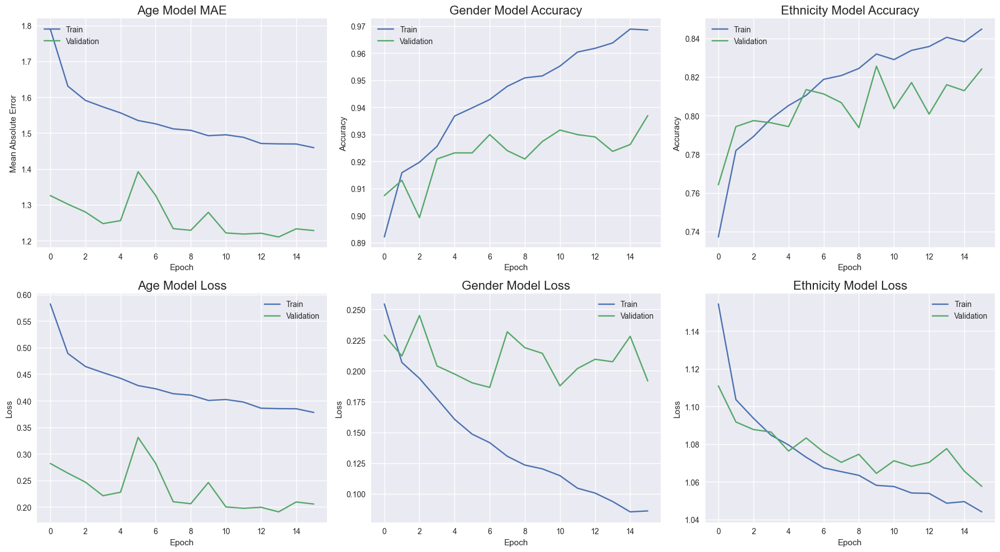

In [59]:
# Plot the training history
plot_epochs(history)

In [60]:
# Evaluate the model
loss, age_loss, gender_loss, ethnicity_loss, age_mae_log, gender_acc, ethnicity_acc = model_incep_imba.evaluate(test_generator_)

age_mae_actual = np.exp(age_mae_log)

dict_age_mae['DW'] = age_mae_actual
dict_gender_accuracy['X'] = gender_acc
dict_ethnicity_accuracy['VSLoss'] = ethnicity_acc

print(f'Validation loss: {loss:.4f}')
print(f'Age loss: {age_loss:.4f}')
print(f'Gender loss: {gender_loss:.4f}')
print(f'Ethnicity loss: {ethnicity_loss:.4f}')
print(f'Age mean absolute error: {age_mae_actual:.4f}')
print(f'Gender accuracy: {gender_acc:.4f}')
print(f'Ethnicity accuracy: {ethnicity_acc:.4f}')

112/112 [==============================] - 6s 47ms/step - loss: 1.6428 - age_loss: 0.2006 - gender_loss: 0.1621 - ethnicity_loss: 1.0794 - age_mae: 0.2006 - gender_accuracy: 0.9347 - ethnicity_accuracy: 0.8016
Validation loss: 1.6428
Age loss: 0.2006
Gender loss: 0.1621
Ethnicity loss: 1.0794
Age mean absolute error: 1.2222
Gender accuracy: 0.9347
Ethnicity accuracy: 0.8016


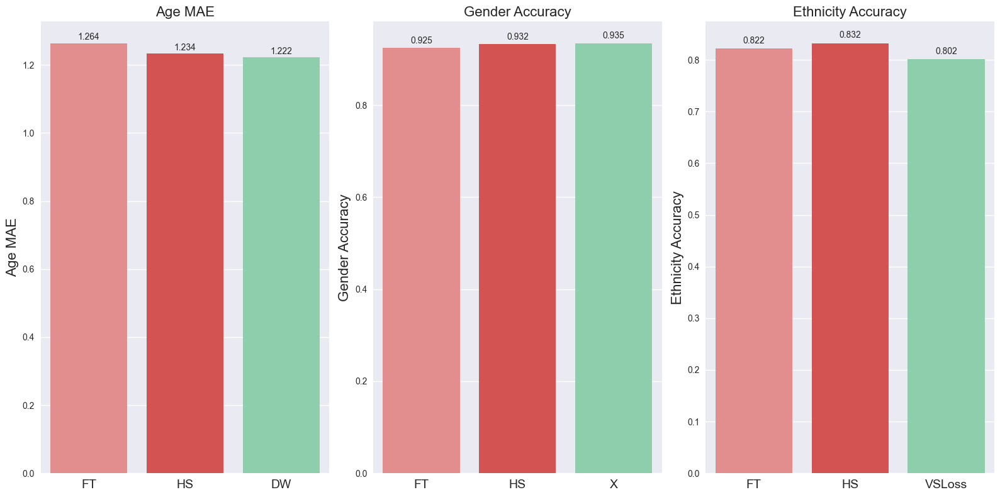

In [61]:
plot_comparison(dict_age_mae, dict_gender_accuracy, dict_ethnicity_accuracy)

In [62]:
# Recherche des hyperparamètres les plus performants

In [63]:
# Define the model builder function for Keras Tuner
def build_model(hp):
    input_layer = Input(shape=(image_size[0], image_size[1], 3))

    base_model = InceptionV3(
        weights='imagenet',
        include_top=False,
        input_tensor=input_layer
    )

    # Add hyperparameter for the percentage of frozen layers
    freeze_percentage = hp.Choice('freeze_percentage', [0, 25, 75, 100])
    num_layers = len(base_model.layers)
    num_frozen_layers = int((freeze_percentage / 100) * num_layers)

    for layer in base_model.layers[:num_frozen_layers]:
        layer.trainable = False
    for layer in base_model.layers[num_frozen_layers:]:
        layer.trainable = True

    x = keras.layers.GlobalAveragePooling2D()(base_model.output)
    x = keras.layers.Flatten()(x)

    dense_size = hp.Choice('dense_size', [512, 1024, 2048, 4096])
    dropout_rate = hp.Choice('dropout_rate', [0.1, 0.2, 0.3, 0.4])

    x_age = Dense(dense_size, activation='relu')(x)
    x_age = Dropout(dropout_rate)(x_age)
    output_age = Dense(1, activation='relu', name='age')(x_age)

    x_gender = Dense(dense_size, activation='relu')(x)
    x_gender = Dropout(dropout_rate)(x_gender)
    output_gender = Dense(1, activation='sigmoid', name='gender')(x_gender)

    x_ethnicity = Dense(dense_size, activation='relu')(x)
    x_ethnicity = Dropout(dropout_rate)(x_ethnicity)
    output_ethnicity = Dense(classes_ethnicite, activation='softmax', name='ethnicity')(x_ethnicity)

    model = Model(inputs=input_layer, 
                  outputs=[output_age, output_gender, output_ethnicity],
                  name="model_incep_hyper")

    # Add learning rate as a hyperparameter
    learning_rate = hp.Choice('learning_rate', [0.00005, 0.0001, 0.0005, 0.001])
    
    # Compile the model
    model.compile(
        optimizer=Adam(lr=learning_rate),
        loss={
            'age': 'mae',
            'gender': 'binary_crossentropy',
            'ethnicity': ethnicity_loss
        },
        loss_weights={
            'age': 2.0,
            'gender': 1.0,
            'ethnicity': 1.0
        },
        metrics={
            'age': 'mae',
            'gender': 'accuracy',
            'ethnicity': 'accuracy'
        }
    )
    return model


ethnicity_loss = VSLoss(cls_num_list)

# Define the objectives as keras_tuner.Objective instances
age_mae_objective = Objective(name="val_age_mae", direction="min")
gender_accuracy_objective = Objective(name="val_gender_accuracy", direction="max")
ethnicity_accuracy_objective = Objective(name="val_ethnicity_accuracy", direction="max")


def build_callbacks():
    return [EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)]
 

tuner = BayesianOptimization(
    build_model,
    objective=[age_mae_objective, gender_accuracy_objective, ethnicity_accuracy_objective],
    max_trials=16,
    num_initial_points=3,
    directory="keras_tuner",
    project_name="tuner",
    overwrite=True
)

# Search for the best model
tuner.search(train_generator_,
             epochs=EPOCHS,
             validation_data=val_generator_,
             callbacks=[build_callbacks()])

Trial 16 Complete [00h 17m 30s]
multi_objective: -1.5069317072629929

Best multi_objective So Far: -1.5647831857204437
Total elapsed time: 07h 04m 17s
INFO:tensorflow:Oracle triggered exit


In [67]:
# Define the model builder function for Keras Tuner
def build_model(hp):
    input_layer = Input(shape=(image_size[0], image_size[1], 3))

    base_model = InceptionV3(
        weights='imagenet',
        include_top=False,
        input_tensor=input_layer
    )

    # Add hyperparameter for the percentage of frozen layers
    freeze_percentage = hp.Choice('freeze_percentage', [0, 25, 75, 100])
    num_layers = len(base_model.layers)
    num_frozen_layers = int((freeze_percentage / 100) * num_layers)

    for layer in base_model.layers[:num_frozen_layers]:
        layer.trainable = False
    for layer in base_model.layers[num_frozen_layers:]:
        layer.trainable = True

    x = keras.layers.GlobalAveragePooling2D()(base_model.output)
    x = keras.layers.Flatten()(x)

    dense_size = hp.Choice('dense_size', [512, 1024, 2048, 4096])
    dropout_rate = hp.Choice('dropout_rate', [0.1, 0.2, 0.3, 0.4])

    x_age = Dense(dense_size, activation='relu')(x)
    x_age = Dropout(dropout_rate)(x_age)
    output_age = Dense(1, activation='relu', name='age')(x_age)

    x_gender = Dense(dense_size, activation='relu')(x)
    x_gender = Dropout(dropout_rate)(x_gender)
    output_gender = Dense(1, activation='sigmoid', name='gender')(x_gender)

    x_ethnicity = Dense(dense_size, activation='relu')(x)
    x_ethnicity = Dropout(dropout_rate)(x_ethnicity)
    output_ethnicity = Dense(classes_ethnicite, activation='softmax', name='ethnicity')(x_ethnicity)

    model = Model(inputs=input_layer, 
                  outputs=[output_age, output_gender, output_ethnicity],
                  name="model_incep_hyper")

    # Add learning rate as a hyperparameter
    learning_rate = hp.Choice('learning_rate', [0.00005, 0.0001, 0.0005, 0.001])
    
    # Compile the model
    model.compile(
        optimizer=Adam(lr=learning_rate),
        loss={
            'age': 'mae',
            'gender': 'binary_crossentropy',
            'ethnicity': ethnicity_loss
        },
        loss_weights={
            'age': 2.0,
            'gender': 1.0,
            'ethnicity': 1.0
        },
        metrics={
            'age': 'mae',
            'gender': 'accuracy',
            'ethnicity': 'accuracy'
        }
    )
    return model


ethnicity_loss = VSLoss(cls_num_list)

# Define the objectives as keras_tuner.Objective instances
age_mae_objective = Objective(name="val_age_mae", direction="min")
gender_accuracy_objective = Objective(name="val_gender_accuracy", direction="max")
ethnicity_accuracy_objective = Objective(name="val_ethnicity_accuracy", direction="max")


def build_callbacks():
    return [EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)]
 

tuner = BayesianOptimization(
    build_model,
    objective=[age_mae_objective, gender_accuracy_objective, ethnicity_accuracy_objective],
    max_trials=16,
    num_initial_points=3,
    directory="keras_tuner",
    project_name="tuner",
    overwrite=True
)

In [64]:
# Print the best hyperparameters
print("Best hyperparameters:", tuner.get_best_hyperparameters()[0].values)

# Get the best hyperparameters
best_hps_ = tuner.get_best_hyperparameters(num_trials=1)[0]

# with open(path + "best_hyperparameters_incep_imba_hyper.pkl", "wb") as f:
#     pickle.dump(best_hps_, f)

Best hyperparameters: {'freeze_percentage': 25, 'dense_size': 512, 'dropout_rate': 0.3, 'learning_rate': 0.0001}


In [68]:
with open(path + "best_hyperparameters_incep_imba_hyper.pkl", "rb") as f:
    loaded_best_hps_ = pickle.load(f)

# Build the model with the best hyperparameters
model_incep_imba_hyper = build_model(loaded_best_hps_) 

In [70]:
# from kerastuner.engine.hyperparameters import HyperParameters

# # Create a new instance of HyperParameters
# new_hps = HyperParameters()

# # Set the values for the hyperparameters
# new_hps.Fixed('freeze_percentage', 0)
# new_hps.Fixed('dense_size', 2048)  # Change dense_size to 2048
# new_hps.Fixed('dropout_rate', 0.3)
# new_hps.Fixed('learning_rate', 0.00005)

# # Build the model with the new hyperparameters
# model_incep_imba_hyper = build_model(new_hps)

In [72]:
ethnicity_loss = VSLoss(cls_num_list)
EPOCHS=25
# Train the model
history = model_incep_imba_hyper.fit(
    train_generator_,
    epochs=EPOCHS,
    validation_data=val_generator_,
    callbacks=[early_stopping]
)

Epoch 1/25
519/519 [==============================] - 101s 171ms/step - loss: 2.8376 - age_loss: 0.5181 - gender_loss: 0.4736 - ethnicity_loss: 1.3277 - age_mae: 0.5181 - gender_accuracy: 0.7667 - ethnicity_accuracy: 0.4748 - val_loss: 2.4451 - val_age_loss: 0.4199 - val_gender_loss: 0.3544 - val_ethnicity_loss: 1.2510 - val_age_mae: 0.4198 - val_gender_accuracy: 0.8467 - val_ethnicity_accuracy: 0.5568
Epoch 2/25
519/519 [==============================] - 87s 168ms/step - loss: 2.2492 - age_loss: 0.3533 - gender_loss: 0.3226 - ethnicity_loss: 1.2201 - age_mae: 0.3533 - gender_accuracy: 0.8565 - ethnicity_accuracy: 0.6246 - val_loss: 1.9954 - val_age_loss: 0.2807 - val_gender_loss: 0.2631 - val_ethnicity_loss: 1.1709 - val_age_mae: 0.2807 - val_gender_accuracy: 0.8832 - val_ethnicity_accuracy: 0.6854
Epoch 3/25
519/519 [==============================] - 88s 169ms/step - loss: 2.0559 - age_loss: 0.3117 - gender_loss: 0.2659 - ethnicity_loss: 1.1666 - age_mae: 0.3117 - gender_accuracy: 0.

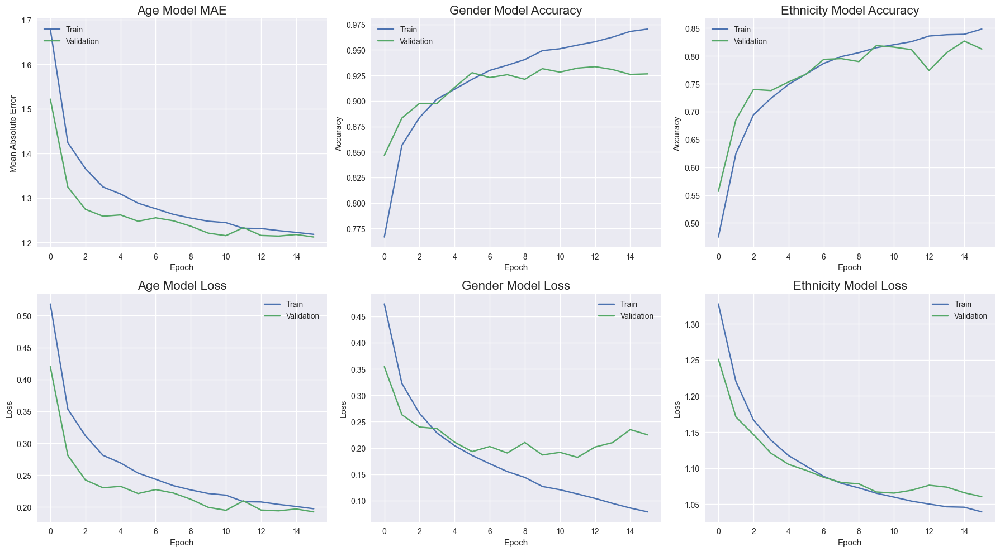

In [73]:
plot_epochs(history)

In [68]:
# model_incep_imba_hyper.save(path + 'model_UTKFace_inception_imba_hyper.h5')

In [69]:
# Define a dictionary containing the custom objects
custom_objects = {'VSLoss': VSLoss}

# Load the model with the custom objects
model_incep_imba_hyper = load_model(path + 'model_UTKFace_inception_imba_hyper.h5', custom_objects=custom_objects)

In [74]:
# Evaluate the model
loss, age_loss, gender_loss, ethnicity_loss, age_mae_log, gender_acc, ethnicity_acc = model_incep_imba_hyper.evaluate(test_generator_)

age_mae_actual = np.exp(age_mae_log)

dict_age_mae['DW / HS'] = age_mae_actual
dict_gender_accuracy['X + HS'] = gender_acc
dict_ethnicity_accuracy['VSLoss / HS'] = ethnicity_acc

print(f'Validation loss: {loss:.4f}')
print(f'Age loss: {age_loss:.4f}')
print(f'Gender loss: {gender_loss:.4f}')
print(f'Ethnicity loss: {ethnicity_loss:.4f}')
print(f'Age mean absolute error: {age_mae_actual:.4f}')
print(f'Gender accuracy: {gender_acc:.4f}')
print(f'Ethnicity accuracy: {ethnicity_acc:.4f}')

112/112 [==============================] - 5s 48ms/step - loss: 1.6650 - age_loss: 0.2014 - gender_loss: 0.1840 - ethnicity_loss: 1.0782 - age_mae: 0.2014 - gender_accuracy: 0.9274 - ethnicity_accuracy: 0.8089
Validation loss: 1.6650
Age loss: 0.2014
Gender loss: 0.1840
Ethnicity loss: 1.0782
Age mean absolute error: 1.2231
Gender accuracy: 0.9274
Ethnicity accuracy: 0.8089


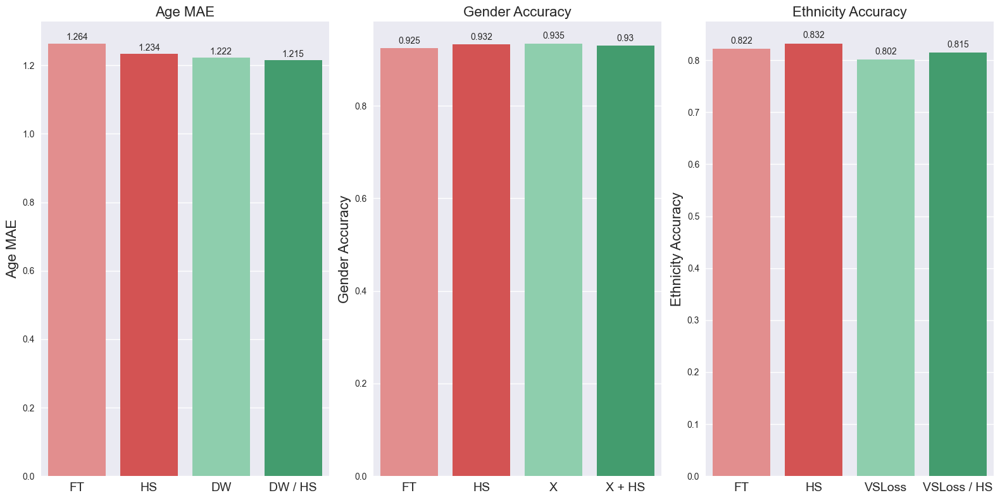

In [71]:
plot_comparison(dict_age_mae, dict_gender_accuracy, dict_ethnicity_accuracy)

1/1 [==============================] - 1s 786ms/step


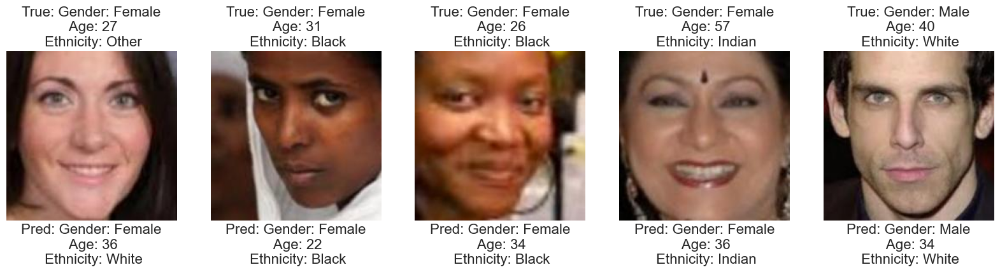

In [72]:
# Get a batch of images and labels from the test_generator
test_images_, test_labels_ = next(test_generator_)

# Get the predictions for the test images
predictions_ = model_incep_imba_hyper.predict(test_images_)

# Define a function to convert the gender and ethnicity labels to their string representations
def decode_labels(age, gender, ethnicity):
    gender_str = "Male" if gender < 0.5 else "Female"
    ethnicity_map = {
        0: 'White',
        1: 'Black',
        2: 'Asian',
        3: 'Indian',
        4: 'Other'}
    ethnicity_str = ethnicity_map[ethnicity]
    return f"Gender: {gender_str}\n Age: {int(np.exp(age))}\n Ethnicity: {ethnicity_str}"

# Plot the first five images in the batch
fig, axes = plt.subplots(1, 5, figsize=(20, 8))
for i in range(5):
    true_age_, true_gender_, true_ethnicity_ = test_labels_[0][i], test_labels_[1][i], test_labels_[2][i]
    true_title_ = decode_labels(true_age_, true_gender_, true_ethnicity_)

    pred_age_, pred_gender_, pred_ethnicity_ = predictions_[0][i][0], predictions_[1][i][0], np.argmax(predictions_[2][i])
    pred_title_ = decode_labels(pred_age_, pred_gender_, pred_ethnicity_)
    
    axes[i].imshow(test_images_[i], cmap='gray')
    axes[i].set_title(f'True: {true_title_}', fontsize=16)
    axes[i].axis('off')
    axes[i].text(0.5, -0.25, f'Pred: {pred_title_}', size=16, ha="center", transform=axes[i].transAxes)
plt.show()

In [83]:
true_labels_, pred_labels_ = get_true_and_pred_labels(test_generator_, model_incep_imba_hyper)

1/1 [==============================] - 0s 24ms/step


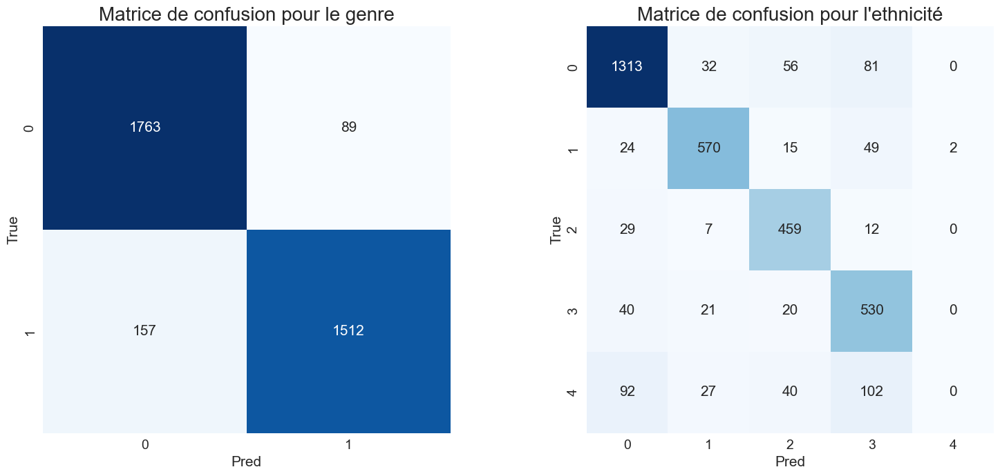

In [74]:
def plot_confusion_matrices(true_labels, pred_labels, titles):
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 7))
    
    for i, ax in enumerate(axes.flat):
        cm = confusion_matrix(true_labels[i + 1, :], pred_labels[i + 1, :])
        heatmap = sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', square=True, cbar=False,
                              annot_kws={"fontsize": 15}, ax=ax)
        heatmap.set_xlabel('Pred', fontsize=15)
        heatmap.set_ylabel('True', fontsize=15)
        heatmap.set_title(titles[i], fontsize=20)
        heatmap.set_xticklabels(heatmap.get_xticklabels(), fontsize=14)
        heatmap.set_yticklabels(heatmap.get_yticklabels(), fontsize=14)
    
    plt.tight_layout()
    plt.show()

titles = ['Matrice de confusion pour le genre', 'Matrice de confusion pour l\'ethnicité']
plot_confusion_matrices(true_labels_, pred_labels_, titles)

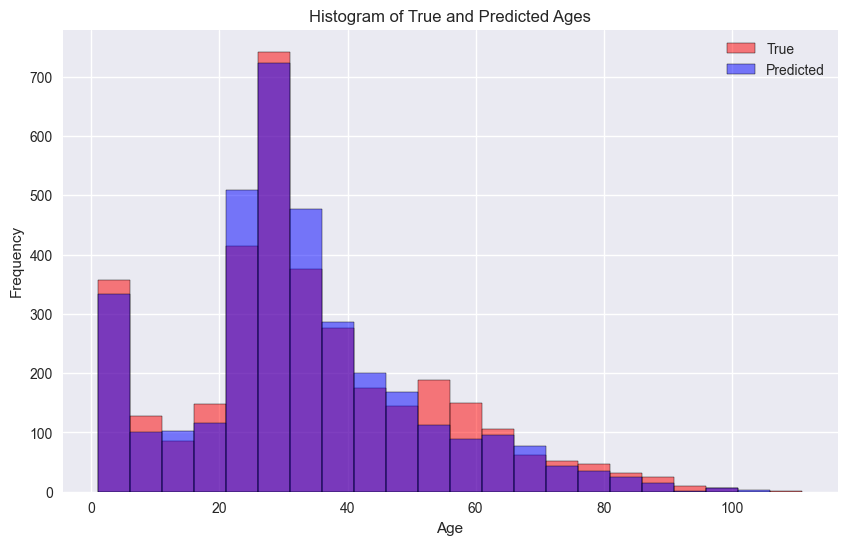

In [75]:
# Plot histogram of true and predicted ages
plt.figure(figsize=(10, 6))
sns.histplot(true_labels_[0], binwidth=5, color='red', alpha=0.5, label='True')
sns.histplot(pred_labels_[0], binwidth=5, color='blue', alpha=0.5, label='Predicted')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Histogram of True and Predicted Ages')
plt.legend()
plt.show()

In [76]:
# Create a dictionary to store the counts for each label
counts = {'True Male': 0, 'Predicted Male': 0, 'True Female': 0, 'Predicted Female': 0}

# Loop over the true and predicted labels and update the counts accordingly
for true_label_, pred_label_ in zip(true_labels_[1], pred_labels_[1]):
    if true_label_ == 0:
        counts['True Male'] += 1
    else:
        counts['True Female'] += 1
    if pred_label_ == 0:
        counts['Predicted Male'] += 1
    else:
        counts['Predicted Female'] += 1

# Compute the total number of samples
n_samples = len(true_labels_[1])

# Create a bar plot with plotly
fig = go.Figure()
fig.add_trace(go.Bar(
    x=list(counts.keys()),
    y=[counts[label]/n_samples for label in counts],
    marker_color=['red', 'blue', 'red', 'blue'],
    opacity=0.5,
    text=[f'{label}: {counts[label]}' for label in counts],
    textposition='auto',
))
fig.update_layout(
    title='Histogram of True and Predicted Genders',
    xaxis_title='Gender',
    yaxis_title='Frequency',
    showlegend=False,
    bargap=0.2,
    height=400,
)

fig.show()

In [77]:
# Compute the frequency counts for true and predicted ethnicities
true_counts_ = [(true_labels_[2] == i).sum() for i in range(5)]
pred_counts_ = [(pred_labels_[2] == i).sum() for i in range(5)]
total_counts_ = sum(true_counts_)

true_freq_ = [count / total_counts_ for count in true_counts_]
pred_freq_ = [count / total_counts_ for count in pred_counts_]

# Create a bar plot with plotly
fig = go.Figure()
fig.add_trace(go.Bar(
    x=['White', 'Black', 'Asian', 'Indian', 'Other'],
    y=true_freq_,
    marker_color='red',
    opacity=0.5,
    name='True'
))
fig.add_trace(go.Bar(
    x=['White', 'Black', 'Asian', 'Indian', 'Other'],
    y=pred_freq_,
    marker_color='blue',
    opacity=0.5,
    name='Predicted'
))

fig.update_layout(
    title='Histogram of True and Predicted Ethnicities',
    xaxis_title='Predicted Ethnicity',
    yaxis_title='Frequency',
    showlegend=True,
    bargap=0.2,
    height=400,
)

fig.show()

## <font color="#114b98" id="section_6">6. Comparaison des performances et analyse</font>

In [ ]:
def plot_comparison_(dict_age_mae, dict_gender_accuracy, dict_ethnicity_accuracy):
    num_subplots = 3
    fig, axs = plt.subplots(nrows=1, ncols=num_subplots, figsize=(16, 8))
    dict_list = [dict_age_mae, dict_gender_accuracy, dict_ethnicity_accuracy]
    labels_list = ['Age MAE', 'Gender Accuracy', 'Ethnicity Accuracy']

    # create a custom color palette with four colors
    custom_palette_2 = sns.color_palette(['#E83E3E', '#34AB6E'])

    for i in range(num_subplots):
        dict_data = dict_list[i]
        labels = list(dict_data.keys())
        values = list(dict_data.values())

        # filter labels and values to only include keys 2 and 4
        filtered_labels = [labels[j] for j in (1, 3)]  # 0-based indexing
        filtered_values = [values[j] for j in (1, 3)]  # 0-based indexing

        sns.barplot(x=filtered_labels, y=filtered_values, palette=custom_palette_2, ax=axs[i])
        axs[i].set_ylabel(labels_list[i], fontsize=16)
        axs[i].set_title(labels_list[i], fontsize=16)
        for j, v in enumerate(filtered_values):
            axs[i].text(j, v + 0.01, str(round(v, 3)), ha='center')
        axs[i].set_xticklabels(filtered_labels, fontsize=14)
    plt.tight_layout()
    plt.show()
    
plot_comparison_(dict_age_mae, dict_gender_accuracy, dict_ethnicity_accuracy)

### <font color="#114b98"> a) Performances sur la prédiction du genre</font>

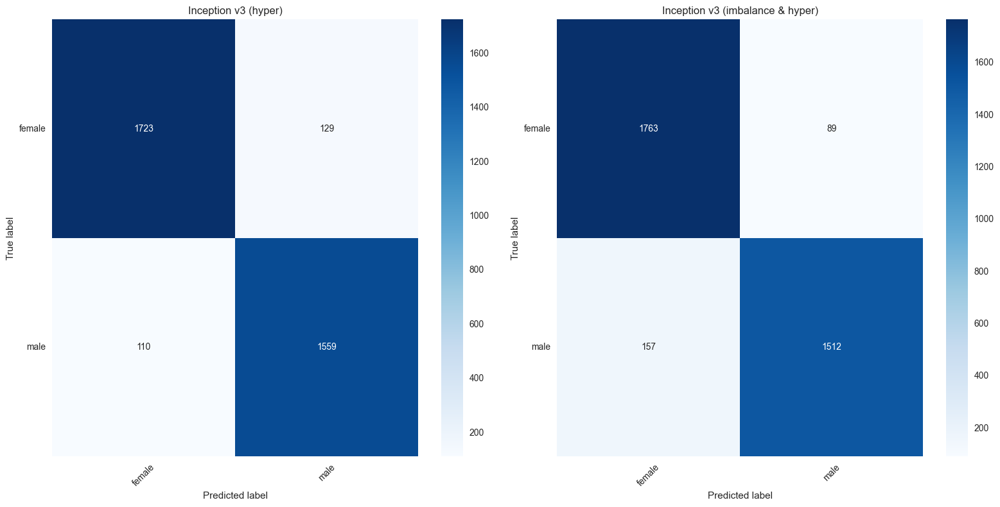

In [78]:
# Function to plot confusion matrix
def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap='Blues'):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    ax = sns.heatmap(cm, annot=True, fmt='.2f' if normalize else 'd', cmap=cmap)
    ax.set_title(title)
    ax.set_xticklabels(classes, rotation=45)
    ax.set_yticklabels(classes, rotation=0)
    ax.set_xlabel('Predicted label')
    ax.set_ylabel('True label')

# Calculate confusion matrices
cnf_matrix_incep_hyper_gender = confusion_matrix(true_labels[1], pred_labels[1])
cnf_matrix_incep_imba_hyper_gender = confusion_matrix(true_labels_[1], pred_labels_[1])

# Plot confusion matrices for gender
plt.figure(figsize=(16,8))
plt.subplot(1, 2, 1)
plot_confusion_matrix(cnf_matrix_incep_hyper_gender, classes=['female', 'male'], title='Inception v3 (hyper)', cmap='Blues')
plt.subplot(1, 2, 2)
plot_confusion_matrix(cnf_matrix_incep_imba_hyper_gender, classes=['female', 'male'], title='Inception v3 (imbalance & hyper)', cmap='Blues')
plt.tight_layout()
plt.show()

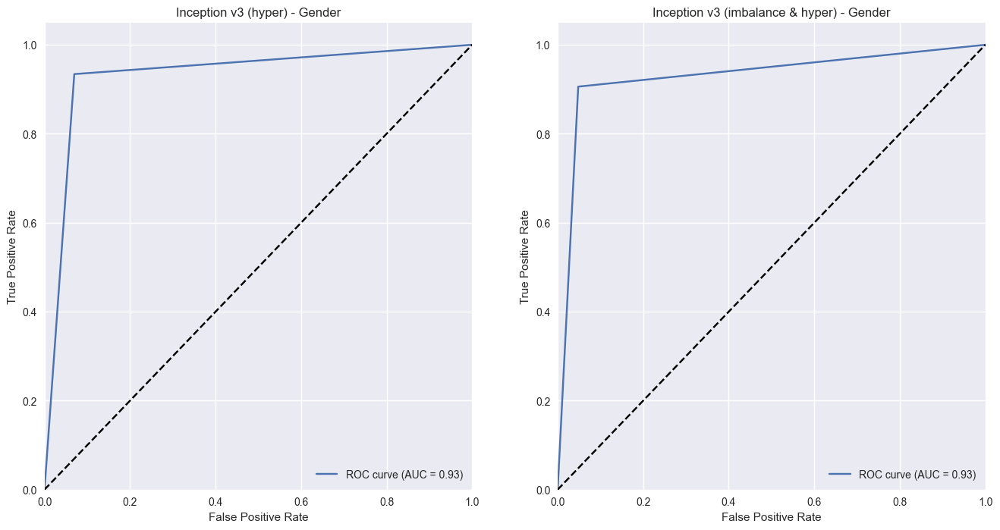

In [79]:
from sklearn.metrics import roc_curve, roc_auc_score

# Compute ROC curves and AUC scores for gender
plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
fpr, tpr, _ = roc_curve(true_labels[1], pred_labels[1])
roc_auc = roc_auc_score(true_labels[1], pred_labels[1])
plt.plot(fpr, tpr, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Inception v3 (hyper) - Gender')
plt.legend(loc="lower right")

plt.subplot(1, 2, 2)
fpr, tpr, _ = roc_curve(true_labels_[1], pred_labels_[1])
roc_auc = roc_auc_score(true_labels_[1], pred_labels_[1])
plt.plot(fpr, tpr, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Inception v3 (imbalance & hyper) - Gender')
plt.legend(loc="lower right")
plt.show()

### <font color="#114b98"> b) Performances sur la prédiction de l'ethnicité</font>

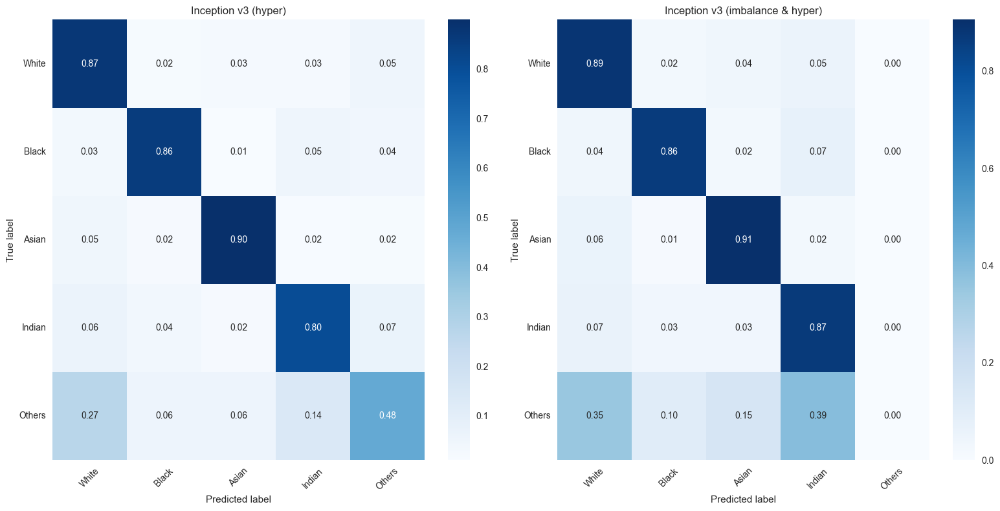

In [80]:
cnf_matrix_incep_hyper_ethnicity = confusion_matrix(true_labels[2], pred_labels[2])
cnf_matrix_incep_imba_hyper_ethnicity = confusion_matrix(true_labels_[2], pred_labels_[2])

# Plot confusion matrices for ethnicity
plt.figure(figsize=(16,8))
plt.subplot(1, 2, 1)
plot_confusion_matrix(cnf_matrix_incep_hyper_ethnicity, classes=ethnicity_mapping.values(), normalize=True, title='Inception v3 (hyper)')
plt.subplot(1, 2, 2)
plot_confusion_matrix(cnf_matrix_incep_imba_hyper_ethnicity, classes=ethnicity_mapping.values(), normalize=True, title='Inception v3 (imbalance & hyper)')
plt.tight_layout()
plt.show()

In [119]:
# Compute the frequency counts for true and predicted ethnicities

true_counts_ = [(true_labels_[2] == i).sum() for i in range(5)]
pred_counts_ = [(pred_labels_[2] == i).sum() for i in range(5)]
total_counts_ = sum(true_counts_)
true_freq_ = [count / total_counts_ for count in true_counts_]
pred_freq_ = [count / total_counts_ for count in pred_counts_]



true_counts = [(true_labels[2] == i).sum() for i in range(5)]
pred_counts = [(pred_labels[2] == i).sum() for i in range(5)]
total_counts = sum(true_counts)
true_freq = [count / total_counts for count in true_counts]
pred_freq = [count / total_counts for count in pred_counts]


# Create a bar plot with plotly
fig = go.Figure()
fig.add_trace(go.Bar(
    x=['White', 'Black', 'Asian', 'Indian', 'Other'],
    y=true_freq,
    marker_color='#E83E3E',
    opacity=0.5,
    name='True'
))
fig.add_trace(go.Bar(
    x=['White', 'Black', 'Asian', 'Indian', 'Other'],
    y=pred_freq,
    marker_color='red',
    opacity=0.5,
    name='InceptionV3'
))
fig.add_trace(go.Bar(
    x=['White', 'Black', 'Asian', 'Indian', 'Other'],
    y=true_freq_,
    marker_color='#83D9AD',
    opacity=0.5,
    name='True'
))
fig.add_trace(go.Bar(
    x=['White', 'Black', 'Asian', 'Indian', 'Other'],
    y=pred_freq_,
    marker_color='#34AB6E',
    opacity=0.5,
    name='DW + VSLoss'
))
fig.update_layout(
    title='Histogram of True and Predicted Ethnicities',
    xaxis_title='Predicted Ethnicity',
    yaxis_title='Frequency',
    showlegend=True,
    bargap=0.2,
    height=400,
)

fig.show()

### <font color="#114b98"> c) Performances sur la prédiction de l'age</font>

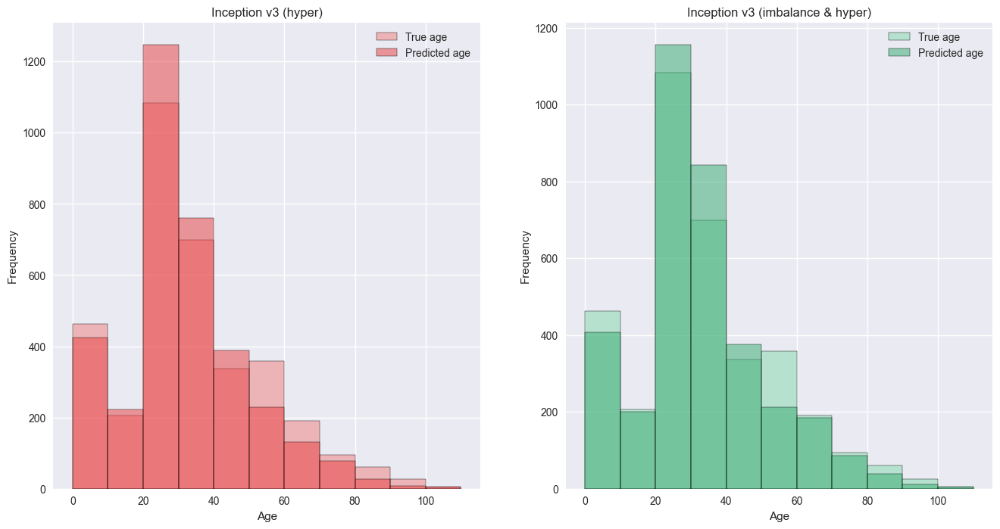

In [82]:
# Plot age distribution histograms
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(16,8))
sns.histplot(true_labels[0], bins=range(0, 120, 10), alpha=0.5, label='True age', color='#F08080', ax=axs[0])
sns.histplot(pred_labels[0], bins=range(0, 120, 10), alpha=0.5, label='Predicted age', color='#E83E3E', ax=axs[0])
axs[0].set_title('Inception v3 (hyper)')
axs[0].set_xlabel('Age')
axs[0].set_ylabel('Frequency')
axs[0].legend()

sns.histplot(true_labels_[0], bins=range(0, 120, 10), alpha=0.5, label='True age', color='#83D9AD', ax=axs[1])
sns.histplot(pred_labels_[0], bins=range(0, 120, 10), alpha=0.5, label='Predicted age', color='#34AB6E', ax=axs[1])
axs[1].set_title('Inception v3 (imbalance & hyper)')
axs[1].set_xlabel('Age')
axs[1].set_ylabel('Frequency')
axs[1].legend()

plt.show()

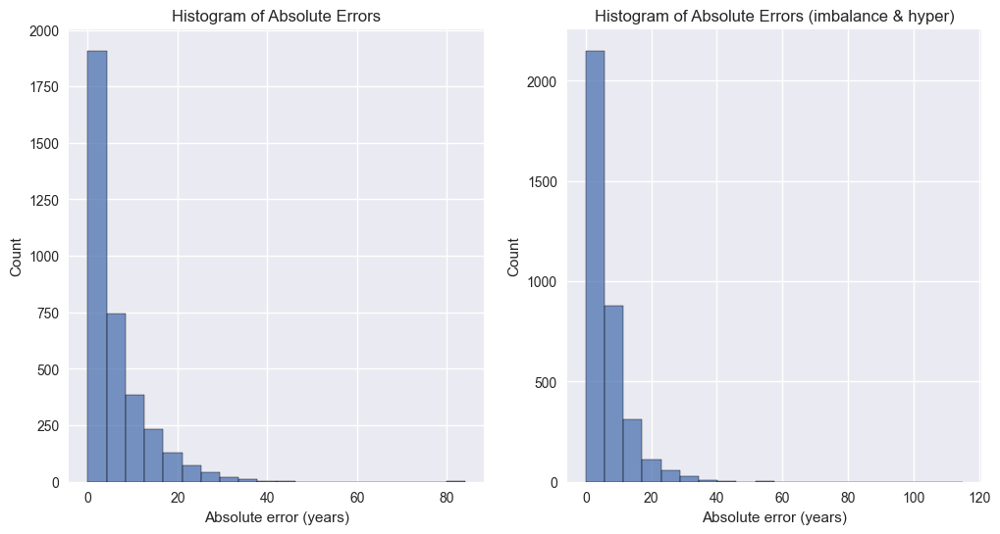

In [90]:
# Calculate the absolute errors
abs_errors = np.abs(pred_labels[0] - true_labels[0])
abs_errors_ = np.abs(pred_labels_[0] - true_labels_[0])

# Create the figure and axes objects
fig, axs = plt.subplots(ncols=2, figsize=(12, 6))

# Plot the distribution of errors for the first histogram
sns.histplot(ax=axs[0], x=abs_errors, bins=20)
axs[0].set_xlabel('Absolute error (years)')
axs[0].set_ylabel('Count')
axs[0].set_title('Histogram of Absolute Errors')

# Plot the distribution of errors for the second histogram
sns.histplot(ax=axs[1], x=abs_errors_, bins=20)
axs[1].set_xlabel('Absolute error (years)')
axs[1].set_ylabel('Count')
axs[1].set_title('Histogram of Absolute Errors (imbalance & hyper)')

# Show the plot
plt.show()

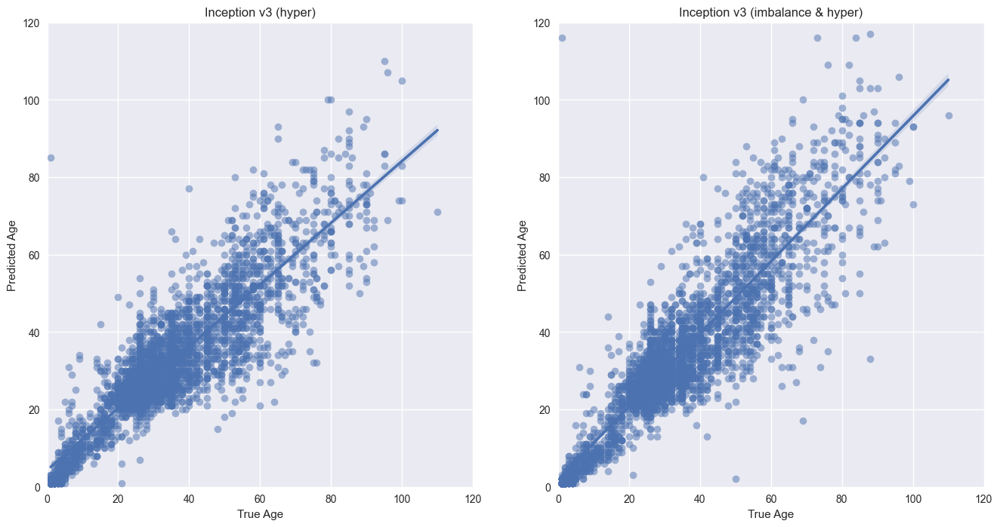

In [98]:
# Scatter plot of true vs. predicted age
plt.figure(figsize=(16, 8))
ax1 = plt.subplot(1, 2, 1)
sns.regplot(x=true_labels[0], y=pred_labels[0], ax=ax1, scatter_kws={'alpha':0.5})
ax1.set_title('Inception v3 (hyper)')
ax1.set_xlabel('True Age')
ax1.set_ylabel('Predicted Age')
ax1.set_xlim(0, 120)
ax1.set_ylim(0, 120)

ax2 = plt.subplot(1, 2, 2)
sns.regplot(x=true_labels_[0], y=pred_labels_[0], ax=ax2, scatter_kws={'alpha':0.5})
ax2.set_title('Inception v3 (imbalance & hyper)')
ax2.set_xlabel('True Age')
ax2.set_ylabel('Predicted Age')
ax2.set_xlim(0, 120)
ax2.set_ylim(0, 120)

plt.show()

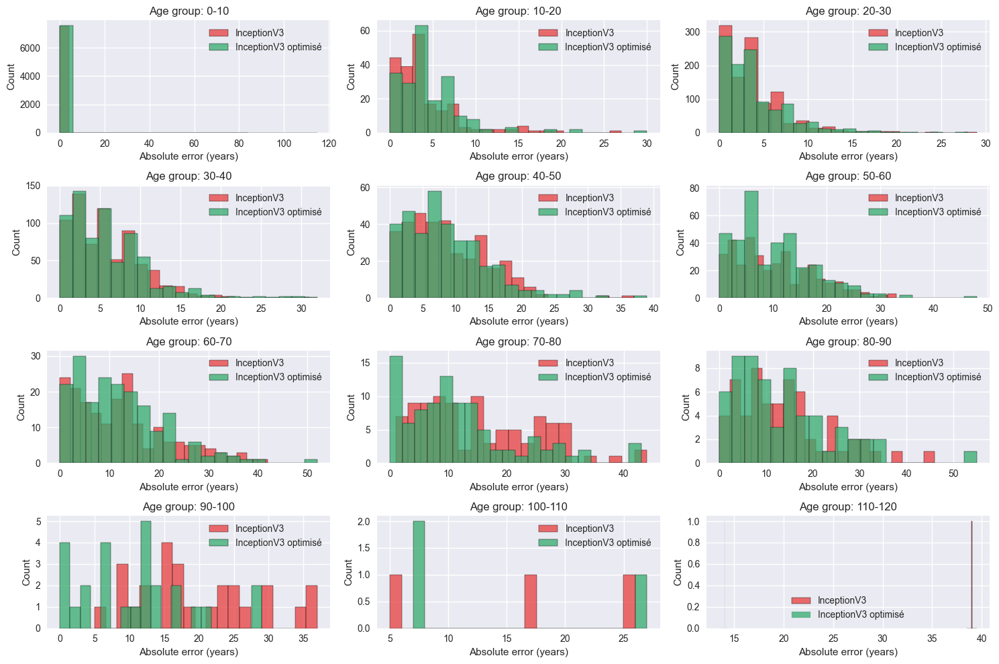

In [97]:
# Define the age groups
age_groups = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120]

# Calculate the absolute errors for true_labels
abs_errors = np.abs(pred_labels - true_labels)

# Calculate the absolute errors for pred_labels
abs_errors_ = np.abs(pred_labels_ - true_labels_)

# Group the samples into different age groups
groups = np.digitize(true_labels, age_groups)

# Calculate the absolute errors for each group
group_errors = [abs_errors[groups == i] for i in range(1, len(age_groups))]
group_errors_ = [abs_errors_[groups == i] for i in range(1, len(age_groups))]

# Create the figure and axes objects
fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(15, 10))

# Flatten the 2D array of axes into a 1D array
axs = axs.flatten()

# Loop over each age group and plot the histogram of absolute errors
for i in range(len(age_groups)-1):
    sns.histplot(group_errors[i], bins=20, ax=axs[i], color='#E83E3E', label='InceptionV3')
    sns.histplot(group_errors_[i], bins=20, ax=axs[i], color='#34AB6E', label='InceptionV3 optimisé')
    axs[i].set_title(f'Age group: {age_groups[i]}-{age_groups[i+1]}')
    axs[i].set_xlabel('Absolute error (years)')
    axs[i].set_ylabel('Count')
    axs[i].legend()

# Hide the empty subplots
for i in range(len(age_groups)-1, len(axs)):
    axs[i].axis('off')

# Adjust the spacing between subplots
fig.tight_layout()

# Show the plot
plt.show()

### <font color="#114b98"> d) Analyse globale</font>

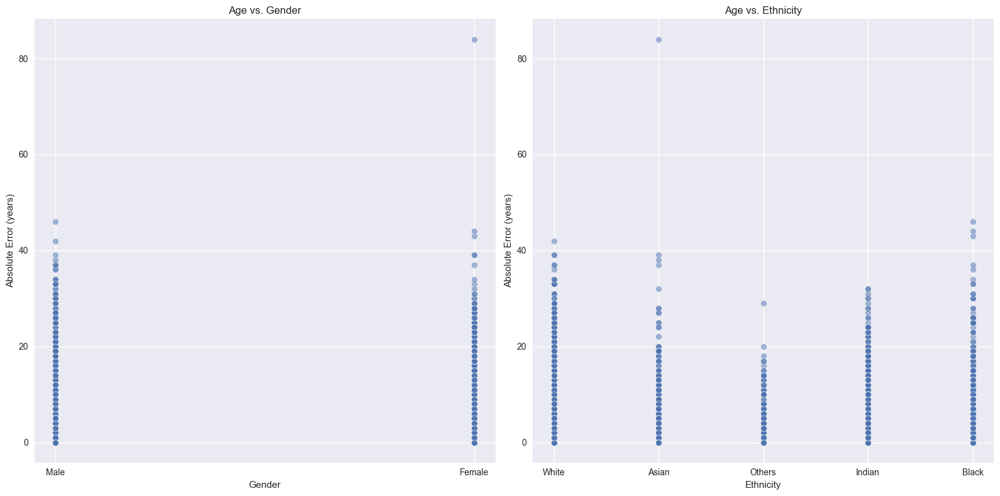

In [109]:
# Map the ethnicity values to their corresponding names
ethnicity_names = [ethnicity_mapping[e] for e in true_labels[2]]

# Map the gender values to their corresponding names
gender_names = ['Male' if g == 1 else 'Female' for g in true_labels[1]]

# Create a scatter plot of absolute errors against ethnicity for age and gender
fig, axs = plt.subplots(1, 2, figsize=(16, 8))

# Age vs. gender
sns.scatterplot(x=gender_names, y=abs_errors[0], alpha=0.5, ax=axs[0])
axs[0].set_xlabel('Gender')
axs[0].set_ylabel('Absolute Error (years)')
axs[0].set_title('Age vs. Gender')

# Age vs. ethnicity
sns.scatterplot(x=ethnicity_names, y=abs_errors[0], alpha=0.5, ax=axs[1])
axs[1].set_xlabel('Ethnicity')
axs[1].set_ylabel('Absolute Error (years)')
axs[1].set_title('Age vs. Ethnicity')

plt.tight_layout()
plt.show()

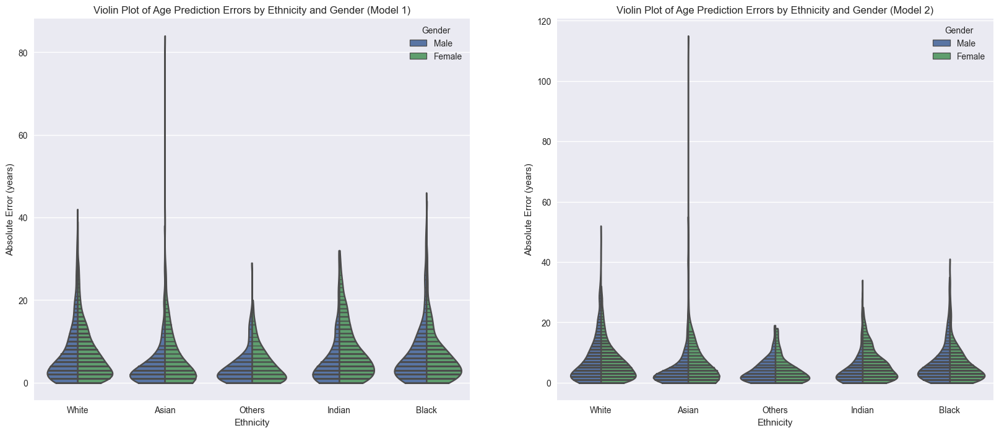

In [128]:
# Map the ethnicity values to their corresponding names
ethnicity_names = [ethnicity_mapping[e] for e in true_labels[2]]
ethnicity_names_ = [ethnicity_mapping[e] for e in true_labels_[2]]

# Map the gender values to their corresponding names
gender_names = ['Male' if g == 1 else 'Female' for g in true_labels[1]]
gender_names_ = ['Male' if g == 1 else 'Female' for g in true_labels_[1]]

# Create a dataframe with the data
data = {'Ethnicity': ethnicity_names, 'Gender': gender_names, 'Absolute Error': abs_errors[0]}
df = pd.DataFrame(data)
data_ = {'Ethnicity': ethnicity_names_, 'Gender': gender_names_, 'Absolute Error': abs_errors_[0]}
df_ = pd.DataFrame(data_)

# Calculate the counts of each combination of ethnicity and gender
counts = df.groupby(['Ethnicity', 'Gender']).size().reset_index(name='Count')
counts_ = df_.groupby(['Ethnicity', 'Gender']).size().reset_index(name='Count')

# Create a violin plot of absolute errors against ethnicity and gender
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 8))
violinplot = sns.violinplot(x='Ethnicity', y='Absolute Error', hue='Gender', data=df, ax=axes[0], split=True, inner='stick', scale='count', scale_hue=True, cut=0)
violinplot_ = sns.violinplot(x='Ethnicity', y='Absolute Error', hue='Gender', data=df_, ax=axes[1], split=True, inner='stick', scale='count', scale_hue=True, cut=0)

# Set the axis labels and title
axes[0].set_xlabel('Ethnicity')
axes[0].set_ylabel('Absolute Error (years)')
axes[0].set_title('Violin Plot of Age Prediction Errors by Ethnicity and Gender (Model 1)')

axes[1].set_xlabel('Ethnicity')
axes[1].set_ylabel('Absolute Error (years)')
axes[1].set_title('Violin Plot of Age Prediction Errors by Ethnicity and Gender (Model 2)')

plt.show()

1/1 [==============================] - 0s 26ms/step


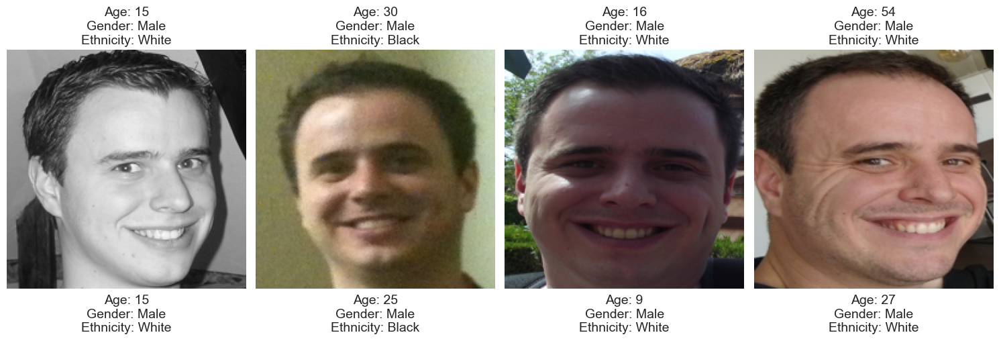

In [147]:
# Load test images
test_images = ["20.jpg", "25.jpg", "30.jpg", "35.jpg"]

# Plot images with predictions
fig, axs = plt.subplots(1, 4, figsize=(15, 5))

for i, image_path in enumerate(test_images):
    # Load image using PIL and resize
    image = Image.open(path + image_path).resize((200, 200))
    image_array = np.array(image) / 255.0  # Convert image to numpy array and normalize pixel values to [0, 1]
    image_array = np.expand_dims(image_array, axis=0)  # Add batch dimension to the array

    # Make a prediction using your model
    predicted_outputs_1, predicted_outputs_2 = model_incep_hyper.predict(image_array), model_incep_imba_hyper.predict(image_array)

    # Retrieve the predicted age, gender, and ethnicity
    predicted_age_1, predicted_gender_1, predicted_ethnicity_1 = predicted_outputs_1[0][0], predicted_outputs_1[1], predicted_outputs_1[2]
    predicted_age_2, predicted_gender_2, predicted_ethnicity_2 = predicted_outputs_2[0][0], predicted_outputs_2[1], predicted_outputs_2[2]

    # Get the predicted ethnicity class
    ethnicity_dict = {0: "White", 1: "Black", 2: "Asian", 3: "Indian", 4: "Other"}
    predicted_ethnicity_str_1 = ethnicity_dict[np.argmax(predicted_ethnicity_1[0])]
    predicted_ethnicity_str_2 = ethnicity_dict[np.argmax(predicted_ethnicity_2[0])]

    # Display the image and the predicted outputs
    predicted_age_str_1, predicted_age_str_2 = str(int(np.exp(predicted_age_1))), str(int(np.exp(predicted_age_2)))
    predicted_gender_str_1, predicted_gender_str_2 = "Male" if predicted_gender_1[0][0] < 0.5 else "Female", "Male" if predicted_gender_2[0][0] < 0.5 else "Female"
    
    axs[i].imshow(image, cmap="gray")
    axs[i].set_title(f"Age: {predicted_age_str_1}\nGender: {predicted_gender_str_1}\nEthnicity: {predicted_ethnicity_str_1}", fontsize=14)
    axs[i].text(0.5, -0.18, f"Age: {predicted_age_str_2}\nGender: {predicted_gender_str_2}\nEthnicity: {predicted_ethnicity_str_2}", fontsize=14, transform=axs[i].transAxes, ha='center')
    axs[i].axis("off")

plt.tight_layout()
plt.show()